## Imports and setup

In [2]:
!git clone https://github.com/leongatys/PytorchNeuralStyleTransfer.git

Cloning into 'PytorchNeuralStyleTransfer'...
remote: Enumerating objects: 16, done.
remote: Total 16 (delta 0), reused 0 (delta 0), pack-reused 16
Unpacking objects: 100% (16/16), done.


In [ ]:
import os
os.mkdir("/content/PytorchNeuralStyleTransfer/Models")
os.mkdir("/content/PytorchNeuralStyleTransfer/Results")

In [4]:
!wget -c --no-check-certificate https://bethgelab.org/media/uploads/pytorch_models/vgg_conv.pth

--2019-01-17 21:02:40--  https://bethgelab.org/media/uploads/pytorch_models/vgg_conv.pth
Resolving bethgelab.org (bethgelab.org)... 46.38.232.246
Connecting to bethgelab.org (bethgelab.org)|46.38.232.246|:443... connected.
  Self-signed certificate encountered.
HTTP request sent, awaiting response... 200 OK
Length: 160198540 (153M) [text/plain]
Saving to: ‘vgg_conv.pth’

vgg_conv.pth        100%[===================>] 152.78M  8.47MB/s    in 40s     

2019-01-17 21:03:22 (3.83 MB/s) - ‘vgg_conv.pth’ saved [160198540/160198540]



In [6]:
import PIL
PIL_version = PIL.PILLOW_VERSION
print(PIL_version)

4.0.0


In [7]:
!pip uninstall -y Pillow
# install the new one if 4.0.0
!pip install Pillow==5.3.0
# import the new one
import PIL
print(PIL.PILLOW_VERSION)

Uninstalling Pillow-4.0.0:
  Successfully uninstalled Pillow-4.0.0
    100% |████████████████████████████████| 2.0MB 16.9MB/s 
  [PIL]
You must restart the runtime in order to use newly installed versions.
4.0.0


In [1]:
# Installing PyTorch on a Colaboratory instance

# http://pytorch.org/
from os.path import exists
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'

!pip install -q http://download.pytorch.org/whl/{accelerator}/torch-0.4.1-{platform}-linux_x86_64.whl torchvision
import torch

tcmalloc: large alloc 1073750016 bytes == 0x583f0000 @  0x7f54847702a4 0x591a07 0x5b5d56 0x502e9a 0x506859 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x504c28 0x502540 0x502f3d 0x507641


In [2]:
%pylab inline
import time
import os
IMAGE_DIR = os.getcwd() + '/PytorchNeuralStyleTransfer/Images/'
MODEL_DIR = os.getcwd() + '/PytorchNeuralStyleTransfer/Models/'
RESULT_DIR = os.getcwd() + '/PytorchNeuralStyleTransfer/Results/'

import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
from torch import optim

import torchvision
from torchvision import transforms

import PIL.Image
from collections import OrderedDict

import matplotlib.pyplot as plt
import numpy as np

Populating the interactive namespace from numpy and matplotlib


In [ ]:
#vgg definition that conveniently let's you grab the outputs from any layer
class VGG(nn.Module):
    def __init__(self, pool='max'):
        super(VGG, self).__init__()
        #vgg modules
        self.conv1_1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_3 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_4 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_4 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_4 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        if pool == 'max':
            self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool5 = nn.MaxPool2d(kernel_size=2, stride=2)
        elif pool == 'avg':
            self.pool1 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool2 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool3 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool4 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool5 = nn.AvgPool2d(kernel_size=2, stride=2)
            
    def forward(self, x, out_keys):
        out = {}
        out['r11'] = F.relu(self.conv1_1(x))
        out['r12'] = F.relu(self.conv1_2(out['r11']))
        out['p1'] = self.pool1(out['r12'])
        out['r21'] = F.relu(self.conv2_1(out['p1']))
        out['r22'] = F.relu(self.conv2_2(out['r21']))
        out['p2'] = self.pool2(out['r22'])
        out['r31'] = F.relu(self.conv3_1(out['p2']))
        out['r32'] = F.relu(self.conv3_2(out['r31']))
        out['r33'] = F.relu(self.conv3_3(out['r32']))
        out['r34'] = F.relu(self.conv3_4(out['r33']))
        out['p3'] = self.pool3(out['r34'])
        out['r41'] = F.relu(self.conv4_1(out['p3']))
        out['r42'] = F.relu(self.conv4_2(out['r41']))
        out['r43'] = F.relu(self.conv4_3(out['r42']))
        out['r44'] = F.relu(self.conv4_4(out['r43']))
        out['p4'] = self.pool4(out['r44'])
        out['r51'] = F.relu(self.conv5_1(out['p4']))
        out['r52'] = F.relu(self.conv5_2(out['r51']))
        out['r53'] = F.relu(self.conv5_3(out['r52']))
        out['r54'] = F.relu(self.conv5_4(out['r53']))
        out['p5'] = self.pool5(out['r54'])
        return [out[key] for key in out_keys]

In [ ]:
# gram matrix and loss
class GramMatrix(nn.Module):
    def forward(self, input):
        b,c,h,w = input.size()
        F = input.view(b, c, h*w)
        G = torch.bmm(F, F.transpose(1,2)) 
        G.div_(h*w)
        return G

class GramMSELoss(nn.Module):
    def forward(self, input, target):
        out = nn.MSELoss()(GramMatrix()(input), target)
        return(out)

In [ ]:
# pre and post processing for images
IMG_SIZE = (128, 128)
prep = transforms.Compose([transforms.Resize(IMG_SIZE),
                           transforms.ToTensor(),
                           transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])]), #turn to BGR
                           transforms.Normalize(mean=[0.40760392, 0.45795686, 0.48501961], #subtract imagenet mean
                                                std=[1,1,1]),
                           transforms.Lambda(lambda x: x.mul_(255)),
                          ])
postpa = transforms.Compose([transforms.Lambda(lambda x: x.mul_(1./255)),
                           transforms.Normalize(mean=[-0.40760392, -0.45795686, -0.48501961], #add imagenet mean
                                                std=[1,1,1]),
                           transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])]), #turn to RGB
                           ])
postpb = transforms.Compose([transforms.ToPILImage()])
def post_processing(tensor): # to clip results in the range [0,1]
    t = postpa(tensor)
    t[t>1] = 1    
    t[t<0] = 0
    img = postpb(t)
    return img



In [ ]:
from google.colab import files

In [7]:
uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving TexturesCom_AbstractVarious0013_S.jpg to TexturesCom_AbstractVarious0013_S.jpg
Saving TexturesCom_Aerials0008_1_S.jpg to TexturesCom_Aerials0008_1_S.jpg
Saving TexturesCom_Aerials0023_1_S.jpg to TexturesCom_Aerials0023_1_S.jpg
Saving TexturesCom_BokehNight0047_S.jpg to TexturesCom_BokehNight0047_S.jpg
Saving TexturesCom_Bones0001_3_S.jpg to TexturesCom_Bones0001_3_S.jpg
Saving TexturesCom_BrickLargeBlocks0021_1_seamless_S.jpg to TexturesCom_BrickLargeBlocks0021_1_seamless_S.jpg
Saving TexturesCom_BrickRound0088_1_seamless_S.jpg to TexturesCom_BrickRound0088_1_seamless_S.jpg
Saving TexturesCom_BrickRound0102_1_seamless_S.jpg to TexturesCom_BrickRound0102_1_seamless_S.jpg
Saving TexturesCom_BrickSmallBrown0293_1_seamless_S.jpg to TexturesCom_BrickSmallBrown0293_1_seamless_S.jpg
Saving TexturesCom_BuildingsDerelict0094_S.jpg to TexturesCom_BuildingsDerelict0094_S.jpg
Saving TexturesCom_Camouflage0003_seamless_S.jpg to TexturesCom_Camouflage0003_seamless_S.jpg
Saving TexturesCom_Cam

In [8]:
!mv vgg_conv.pth PytorchNeuralStyleTransfer/Models/
!mv *.jpg *.png PytorchNeuralStyleTransfer/Images/

mv: cannot stat '*.png': No such file or directory


## Texture synthesis

### Random Phase Noise

In [ ]:

def RPN_texture_synthesis(target_img_filename, img_size=IMG_SIZE, display=True):
    """
    Texture synthesis using Random Phase Noise

    Parameters
    ------------
    - target_img_filename : string
      Filename of the target image in the image directory
    - img_size : tuple
      Image target image
      Default: (128, 128)

    - display : boolean
      Whether to display the target and result
    Returns
    ------------
    - new_texture : numpy.ndarray
      Generated texture
    """

    i = np.complex(0,1)

    # Retrieve target image
    path = os.path.join(IMAGE_DIR, target_img_filename)
    source_texture = PIL.Image.open(path)

    # TODO: Resize
    source_texture = np.array(source_texture.resize(img_size, PIL.Image.ANTIALIAS))
    
    
    img_shape = source_texture.shape
    
    
    
    # Create random phase
    gauss_noise = np.random.randn(img_shape[0], img_shape[1])
    noise = np.fft.fft2(gauss_noise)

    # Create new texture (iterate over channels in Fourier space)
    new_texture_fft = np.zeros(img_shape, dtype=complex)
    for channel in range(img_shape[-1]):
        new_texture_fft[:, :, channel] = np.multiply((np.fft.fft2(source_texture[:, :, channel])), np.exp(-i*np.angle(noise)))

    # Transform back to original space
    new_texture = np.zeros(img_shape, dtype=float)
    for channel in range(img_shape[-1]):
        img_channel = np.real(np.fft.ifft2(new_texture_fft[:, :, channel]))
        new_texture[:,:, channel] = (img_channel - np.min(img_channel))/(np.max(img_channel) - np.min(img_channel))

    # Display texture
    if display:
        print("-" * 20)
        print("Random Phase Noise result")
        print("-" * 20)
        f, ax = plt.subplots(1, 2)
        ax[0].imshow(source_texture)
        ax[0].set_axis_off()
        ax[1].imshow(new_texture)
        ax[1].set_axis_off()
        plt.show()
    
    # Convert texture to Tensor
    
    new_texture = prep(PIL.Image.fromarray(np.uint8(new_texture*255)))
    
    if torch.cuda.is_available():
        new_texture = Variable(new_texture.unsqueeze(0).cuda())
    else:
        new_texture = Variable(new_texture.unsqueeze(0))
    
    return new_texture

--------------------
Random Phase Noise result
--------------------


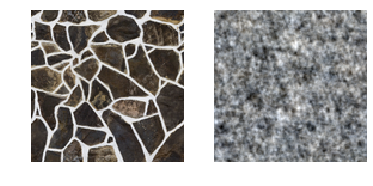

CPU times: user 2.08 s, sys: 770 ms, total: 2.85 s
Wall time: 2.85 s


In [10]:
%%time
new_texture = RPN_texture_synthesis("TexturesCom_BrickRound0102_1_seamless_S.jpg")

### Main utility functions

In [ ]:
def load_target(target_img_filename):
    """
    Load the target image from the image directory

    Parameters
    -----------
    - target_img_filename : string
      Filename of the target image
      in the image directory

    Returns
    - target_img : torch.Tensor
      Target image in tensor form
    """
    path = os.path.join(IMAGE_DIR, target_img_filename)
    target_img = prep(PIL.Image.open(path))
    if torch.cuda.is_available():
        target_img = Variable(target_img.unsqueeze(0).cuda())
    else:
        target_img = Variable(target_img.unsqueeze(0))
    return target_img
  
  
def display_start(target_img, input_img):
    """
    Display target alongside random input

    Parameters
    ------------
    - target_img
        Target image output from ``load_target``
    """


    # Convert tensors to PIL images 
    target_img = post_processing(target_img.data[0].cpu().squeeze())
    input_img = post_processing(input_img.data[0].cpu().squeeze())
    imgs = [target_img, input_img]
    titles = ["target", "random input"]

    # Display settings
    rows = 1
    columns = 2
    fig = plt.figure(figsize=(12, 10))
    for i, out in enumerate(zip(imgs, titles)):
        fig.add_subplot(rows, columns, i + 1)
        plt.title(f"{out[1]} image")
        plt.imshow(out[0])
        plt.axis("off");
    plt.show();
    
def display_end(target_img, output_img):
    """
    Display target alongside final output

    Parameters
    ------------
    - target_img
        Target image output from ``load_target``
    """


    # Convert tensors to PIL images 
    target_img = post_processing(target_img.data[0].cpu().squeeze())
    output_img = post_processing(output_img.data[0].cpu().squeeze())
    imgs = [target_img, output_img]
    titles = ["target", "output"]

    # Display settings
    rows = 1
    columns = 2
    fig = plt.figure(figsize=(12, 10))
    for i, out in enumerate(zip(imgs, titles)):
        fig.add_subplot(rows, columns, i + 1)
        plt.title(f"{out[1]} image")
        plt.imshow(out[0])
        plt.axis("off");
    plt.show();
    
    
def load_model(random_weights, pool="max", layer_type="content",
               ranVGG=False, fit_on_target=False, base_img_filename=None):
    """
    Load VGG model (trained or random)
    
    Parameters
    -----------
    - random_weights : boolean
        True if randomly initialized
        False if pre-trained on Imagenet
        
    - pool : string (optional)
        Pooling method: max or average
        Default: 'max'.
        
    - ranVGG : boolean
      Whether to instantiate the ranVGG network 
      constructed in the "Random network construction method" below 
      Default: False.
      
    - fit_on_target : boolean
      Whether to construct a new ranVGG instance using the actual target image
      Default: False
      
    - target_img_filename : string
      Filename of the target image
      in the image directory
      Default: None
      
    - layer_type : string
      Layer type to be used. Either 'content' or 'style'
      This induces a different loss.
      'content' -> standard MSE
      'style' -> Gram MSE
      Default: 'content'
      
    Returns
    -----------
    - vgg : VGG class
        See above for class definition
    """
    # Pooling method
    if not pool in ["max", "avg"]:
        raise ValueError(f"Invalid input. Pool: {pool}.")
    # VGG model instance
    vgg = VGG(pool)
    # Load weights if pre-trained
    if not random_weights:
      vgg.load_state_dict(torch.load(os.path.join(MODEL_DIR, 'vgg_conv.pth')))
    # Disable gradient updates
    if ranVGG:
      if not fit_on_target:
        vgg.load_state_dict(torch.load(os.path.join(MODEL_DIR, "ranVGG.pth")))
      else:
        vgg = build_ranVGG(base_img_filename, layer_type=layer_type, pool=pool)
    for param in vgg.parameters():
        param.requires_grad = False
    # Send model to CUDA
    if torch.cuda.is_available():
        vgg.cuda()
    return vgg
  
  
def save_output(output_img, filename):
    """
    Save output image in result folder
    
    Parameters
    -----------
    - output_img : torch.Tensor
    
    - filename : string
        Filename in the results directory
    """
    
    #fig = plt.figure(figsize=(12, 7))
    #plt.title(f"Output: {filename}")
    plt.imshow(output_img)
    plt.axis("off")
    #plt.savefig(os.path.join(RESULT_DIR, filename));
    
    
    
def compute_RPN_loss(target_img_filename, random_weights,
                     style_layers, loss_fns, weights, pool="max",
                     model=None):
    """
    Load the target image from the image directory

    Parameters
    -----------
    - target_img_filename : string
      Filename of the target image
      in the image directory
      
    - random_weights : boolean
      Random or pre-trained
    
    - pool : string
      Pooling strategy (max or avg)
      
    - style_layers : list of strings
      Layers to use for the texture synthesis
      
    - loss_fns : list of GramMSELoss
      Loss functions at layer level to be combined

    - weights : list of weights
      Weighting factors to be used
      
    - model : VGG
      Model to be used
      Default: None
    
    
    Returns
    - rpn_loss : float
      RPN Loss
    """
    
    target_img = load_target(target_img_filename)
    
    rpn_texture = RPN_texture_synthesis(target_img_filename, display=False)
    if model is not None:
      vgg = load_model(random_weights=random_weights, pool=pool)
    else:
      vgg = model
    
    loss_layers = style_layers
    
    out = vgg(new_texture, loss_layers)
    layer_losses = [weights[a] * loss_fns[a](A, targets[a]) for a, A in enumerate(out)]
    loss = sum(layer_losses)
    
    rpn_loss = loss.data[0]
    
    return rpn_loss
    
    
    
def texture_synthesis(target_img_filename, random_weights=True, pool="max", 
                      max_iter=1000, show_iter=200, init="random",
                      RPN=False, ranVGG=False, fit_on_target=False, compute_weight_factors=False,
                      layer_type="content"):
    """
    Procedure to produce a texture from a target image
    
    Parameters
    ----------
    - target_img_filename : string
      Filename of the target image
      in the image directory
      
    - random_weights : boolean
        True if randomly initialized
        False if pre-trained on Imagenet
        Default: True
        
    - max_iter : int
        Number of iterations
        Default: 1000
        
    - show_iter : int
        Number of iterations at which to display the images
        Default: 200
    
    - pool : string
      Pooling strategy (max or avg)
      Default: 'max'
      
    - ranVGG : boolean (optional)
      Whether to instantiate the ranVGG network 
      constructed in the "Random network construction method" below 
      Default: False
      
    - init : string
      Key for initialization method
      Expect: ['random', 'zero', 'RPN']
      Default: 'random'
      
    - RPN : boolean
      Whether to run a RPN experiment and compute the RPN loss
      
    - fit_on_target : boolean
      Whether to construct a new ranVGG instance using the actual target image
      Default: False
      
    - compute_weight_factors : boolean
      Whether to compute the weighting factors
      
    - layer_type : string
      Layer type to be used in ranVGG construction.
      Either 'content' or 'style'.
      This induces a different loss.
      'content' -> standard MSE
      'style' -> Gram MSE
      Default: 'content'
    
    Returns
    ----------
    - input_image : PIL Image
        Input image on which the optimization has been done
        
    - coarse_loss : list
        Coarse loss evolution
    """

    ###########################
    # Parameters sanity check #
    ###########################    
    INITS = ["random", "zero", "RPN"]
    if init not in INITS:
      raise ValueError(f"Invalid init argument. Got: {init}." 
                       f"Expected an element of: {INITS}")
    
    ########
    # DATA #
    ########
    # Load target image
    target_img = load_target(target_img_filename)
    
    if init == "RPN":
        input_img = RPN_texture_synthesis(target_img_filename, display=False)
        input_img.requires_grad = True
        
    else:
        # Randomly initialized input image
        input_img = Variable(
                      torch.randn(target_img.size()).type_as(target_img.data),
                      requires_grad=True)
    # Display start
    print("-" * 20)
    print("Starting configuration")
    print(f"Image size: {target_img.size()}")
    print(f"Random weights: {random_weights}")
    print(f"ranVGG? {ranVGG}")
    print(f"Fit ranVGG on target? {fit_on_target}")
    print(f"Pooling type: {pool}")
    print(f"Compute weighting factors on style layers? {compute_weight_factors}")
    print(f"Number of iterations: {max_iter}")
    print(f"Loss display every {show_iter} iterations")
    print(f"Compute RPN loss? {RPN}")
    print("-" * 20)
    display_start(target_img, input_img)
    print("-" * 20)
    
    #########
    # MODEL #
    #########
    vgg = load_model(random_weights=random_weights, pool=pool, ranVGG=ranVGG,
                     fit_on_target=fit_on_target, base_img_filename=target_img_filename,
                     layer_type=layer_type)
    
    
    #########
    # SETUP #
    #########
    #define layers, loss functions, weights and compute optimization targets
    style_layers = ['r11', 'r21','r31','r41', 'r51'] 
    # style_weights = [1e3/n**2 for n in [64,128,256,512,512]] # what about these weights?
    loss_layers = style_layers
    
    loss_fns = [GramMSELoss()] * len(style_layers)
    if torch.cuda.is_available():
        loss_fns = [loss_fn.cuda() for loss_fn in loss_fns]

    #these are good weights settings:
    style_weights = [1 for n in [64,128,256,512,512]]
    weights = style_weights

    #compute optimization targets
    style_targets = [GramMatrix()(A).detach() for A in vgg(target_img, style_layers)]
    targets = style_targets
    
    # Hyperparameters
    max_iter = max_iter
    show_iter = show_iter
    
    
    #############
    # MAIN LOOP #
    #############
    optimizer = optim.LBFGS([input_img]);
    n_iter=[0]

    #trained_loss_evolution = [0 for i in range(max_iter + 1)]
    #fine_loss = list()
    coarse_loss = list()
    
          
    ##################
    # Weight factors #
    ##################
    if compute_weight_factors:
      mu = [[]]
      once = [False]
      while n_iter[0] < max_iter:
        def closure():
            optimizer.zero_grad()
            if not once[0]:
                if init == "zero":
                    zero_img = Variable(
                        torch.zeros(target_img.size()).type_as(target_img.data),
                        requires_grad=True) # Null image initialization
                    out = vgg(zero_img, loss_layers)
                    
                else:
                    out = vgg(input_img, loss_layers)
            else:
                out = vgg(input_img, loss_layers)
            layer_losses = [weights[a] * loss_fns[a](A, targets[a]) for a, A in enumerate(out)]
            
            if not once[0] : #JE NE VEUX FAIRE CE BLOC QU'UNE FOIS
                print("Normalization factors:")
                for loss in layer_losses:
                    loss.backward(retain_graph=True) #retain_graph permet de preserver le flux de gradients descendants
                    if init == "zero":
                        mu_inv = np.abs(zero_img.grad.mean().item()) #Je prends la moyenne
                    else:
                        mu_inv = np.abs(input_img.grad.mean().item()) #Je prends la moyenne
                    print(1 / mu_inv)
                    mu[0].append(1/max(float(str(mu_inv)), 0.0001)) # float(str) pour eviter les erreurs de type Tensor.cuda vs Tensor.cpu
                    if not init == "zero":
                      input_img.grad.data.zero_()
                once[0] = True
            loss = sum([ mu[0][a] * loss_fns[a](A, targets[a]) for a, A in enumerate(out)]) #loss avec les normalisations
            loss.backward()
            #fine_loss.append(loss)
            n_iter[0]+=1

            #print loss
            if n_iter[0] % show_iter == (show_iter-1):
                print('Iteration: %d, loss: %f'%(n_iter[0]+1, loss.data[0]))
                coarse_loss.append(loss.data[0])
            return loss

        optimizer.step(closure)
           
    else:
      while n_iter[0] < max_iter:

          def closure():
              optimizer.zero_grad()
              out = vgg(input_img, loss_layers)
              layer_losses = [weights[a] * loss_fns[a](A, targets[a]) for a, A in enumerate(out)]
              loss = sum(layer_losses)
              loss.backward()
              #fine_loss.append(loss)
              n_iter[0]+=1

              #print loss
              if n_iter[0] % show_iter == (show_iter-1):
                  print('Iteration: %d, loss: %f'%(n_iter[0]+1, loss.data[0]))
                  coarse_loss.append(loss.data[0])
              return loss

          optimizer.step(closure)
        
        
    output_img = input_img
    print("-" * 20)
    print("Final output")
    display_end(target_img, output_img)
    print("-" * 20)
    
    output_img = post_processing(output_img.data[0].cpu().squeeze())
    
    
    #############################
    # Random Phase Noise result #
    #############################
    rpn_loss = None
    if RPN:
        rpn_loss = compute_RPN_loss(target_img_filename, random_weights,
                     style_layers, loss_fns, weights, pool, model=vgg)
    
    
    return output_img, coarse_loss, rpn_loss

### Gradient normalization

In [ ]:
def grad_texture_synthesis(target_img_filename, random_weights, pool, 
                      max_iter, show_iter, init="random", RPN=False, ranVGG=False, fit_on_target=False):
    """
    Procedure to produce a texture from a target image
    using the normalization factors described in the original paper
    
    Parameters
    ----------
    - target_img_filename : string
      Filename of the target image
      in the image directory
      
    - random_weights : boolean
        True if randomly initialized
        False if pre-trained on Imagenet
        
    - max_iter : int
        Number of iterations
        
    - show_iter : int
        Number of iterations at which to display the images
        
    - ranVGG : boolean (optional)
      Whether to instantiate the ranVGG network 
      constructed in the "Random network construction method" below 
      Default: False
      
    - init : string
      Key for initialization method
      Expect: ['random', 'zero', 'RPN']
      Default: 'random'
      
    - RPN : boolean
      Whether to run a RPN experiment and compute the RPN loss
      
          
    - fit_on_target : boolean
      Whether to construct a new ranVGG instance using the actual target image
      Default: False
    
    Returns
    ----------
    - input_image : PIL Image
        Input image on which the optimization has been done
        
    - coarse_loss : list
        Coarse loss evolution
    """
    ###########################
    # Parameters sanity check #
    ###########################
    
    INITS = ["random", "zero", "RPN"]
    if init not in INITS:
      raise ValueError(f"Invalid init argument. Got: {init}." 
                       f"Expected an element of: {INITS}")
    
    ########
    # DATA #
    ########
    # Load target image
    target_img = load_target(target_img_filename)
    
    if init == "RPN":
        input_img = RPN_texture_synthesis(target_img_filename, display=False)
        input_img.requires_grad = True
        
    else:
        # Randomly initialized input image
        input_img = Variable(
                      torch.randn(target_img.size()).type_as(target_img.data),
                      requires_grad=True)
    # Display start
    print("-" * 20)
    print("Starting configuration")
    print(f"Random weights: {random_weights}")
    print(f"Number of iterations: {max_iter}")
    print(f"Loss display every {show_iter} iterations")
    print(f"Image size: {target_img.size()}")
    print(f"Pooling type: {pool}")
    print("-" * 20)
    display_start(target_img, input_img)
    print("-" * 20)
    
    #########
    # MODEL #
    #########
    vgg = load_model(random_weights=random_weights, pool=pool, ranVGG=ranVGG,
                     fit_on_target=fit_on_target, base_img_filename=target_img_filename)
    
    
    #########
    # SETUP #
    #########
    #define layers, loss functions, weights and compute optimization targets
    style_layers = ['r11', 'r21', 'r31', 'r41', 'r51'] 
    loss_layers = style_layers
    
    loss_fns = [GramMSELoss()] * len(style_layers)
    if torch.cuda.is_available():
        loss_fns = [loss_fn.cuda() for loss_fn in loss_fns]

    #these are good weights settings:
    style_weights = [1 for n in [64,128,256,512,512]]
    # style_weights = [1e3/n**2 for n in [64,128,256,512,512]] # what about these weights?
    weights = style_weights

    #compute optimization targets
    style_targets = [GramMatrix()(A).detach() for A in vgg(target_img, style_layers)]
    targets = style_targets
    
    # Hyperparameters
    max_iter = max_iter
    show_iter = show_iter
    
    
    #############
    # MAIN LOOP #
    #############
    optimizer = optim.LBFGS([input_img]);
    n_iter=[0]

    #trained_loss_evolution = [0 for i in range(max_iter + 1)]
    #fine_loss = list()
    coarse_loss = list()
    mu = [[]]
    once = [False]
    while n_iter[0] < max_iter:

        def closure():
            optimizer.zero_grad()
            if not once[0]:
                if init == "zero":
                    zero_img = Variable(
                        torch.zeros(target_img.size()).type_as(target_img.data),
                        requires_grad=True) # Null image initialization
                    out = vgg(zero_img, loss_layers)
                    
                else:
                    out = vgg(input_img, loss_layers)
            else:
                out = vgg(input_img, loss_layers)
            layer_losses = [weights[a] * loss_fns[a](A, targets[a]) for a, A in enumerate(out)]
            
            if not once[0] : #JE NE VEUX FAIRE CE BLOC QU'UNE FOIS
                print("Normalization factors:")
                for loss in layer_losses:
                    loss.backward(retain_graph=True) #retain_graph permet de preserver le flux de gradients descendants
                    if init == "zero":
                        mu_inv = np.abs(zero_img.grad.mean().item()) #Je prends la moyenne
                    else:
                        mu_inv = np.abs(input_img.grad.mean().item()) #Je prends la moyenne
                    print(1 / mu_inv)
                    mu[0].append(1/max(float(str(mu_inv)), 0.0001)) # float(str) pour eviter les erreurs de type Tensor.cuda vs Tensor.cpu
                    if not init == "zero":
                      input_img.grad.data.zero_()
                once[0] = True
            loss = sum([ mu[0][a] * loss_fns[a](A, targets[a]) for a, A in enumerate(out)]) #loss avec les normalisations
            loss.backward()
            #fine_loss.append(loss)
            n_iter[0]+=1

            #print loss
            if n_iter[0] % show_iter == (show_iter-1):
                print('Iteration: %d, loss: %f'%(n_iter[0]+1, loss.data[0]))
                coarse_loss.append(loss.data[0])
            return loss

        optimizer.step(closure)
        
        
    output_img = input_img
    print("-" * 20)
    print("Final output")
    display_end(target_img, output_img)
    print("-" * 20)
    
    output_img = post_processing(output_img.data[0].cpu().squeeze())
    
    #############################
    # Random Phase Noise result #
    #############################
    
    rpn_loss = None
    if RPN:
        rpn_loss = compute_RPN_loss(target_img_filename, random_weights,
                     style_layers, loss_fns, weights, pool, model=vgg)
    
    return output_img, coarse_loss, rpn_loss

--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Loss display every 10 iterations
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------


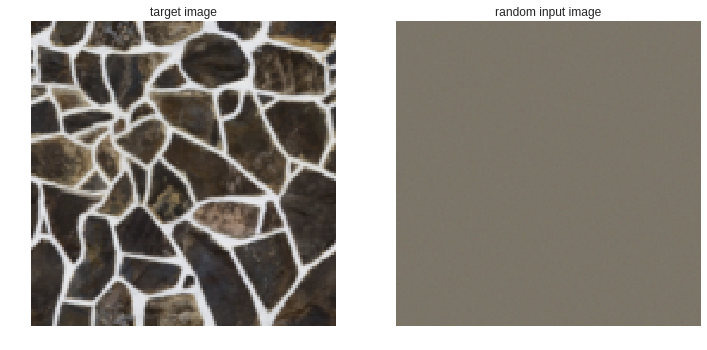

--------------------
Normalization factors:
3865.91108696836
3849.0396895472686
3849.0396895472686
3849.0396895472686
3849.0396895472686


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:144: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:145: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 10, loss: 347916608.000000
Iteration: 20, loss: 109770880.000000
Iteration: 30, loss: 54929048.000000
Iteration: 40, loss: 1944679.750000
Iteration: 50, loss: 272491.375000
Iteration: 60, loss: 65504.417969
Iteration: 70, loss: 23633.851562
Iteration: 80, loss: 11767.577148
Iteration: 90, loss: 6463.870605
Iteration: 100, loss: 4136.151855
--------------------
Final output


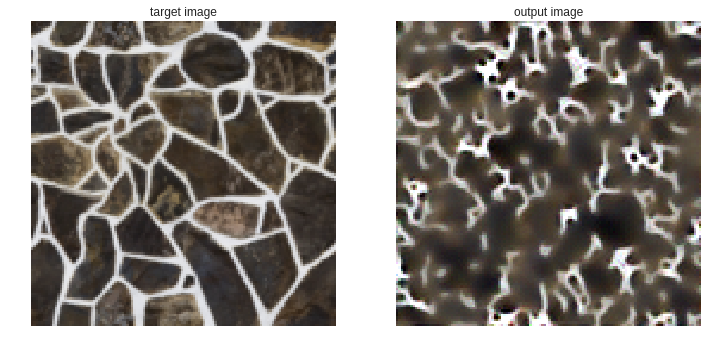

--------------------


(<PIL.Image.Image image mode=RGB size=128x128 at 0x7F1985FB1278>,
 [tensor(347916608., device='cuda:0'),
  tensor(109770880., device='cuda:0'),
  tensor(54929048., device='cuda:0'),
  tensor(1944679.7500, device='cuda:0'),
  tensor(272491.3750, device='cuda:0'),
  tensor(65504.4180, device='cuda:0'),
  tensor(23633.8516, device='cuda:0'),
  tensor(11767.5771, device='cuda:0'),
  tensor(6463.8706, device='cuda:0'),
  tensor(4136.1519, device='cuda:0')],
 63)

In [ ]:
grad_texture_synthesis("TexturesCom_BrickRound0102_1_seamless_S.jpg", random_weights=True, pool="max",
                      max_iter=100, show_iter=10, RPN=True, init="zero")

### ranVGG construction method

In [ ]:
def deep_representation_inversion(target_img_filename, model, layer_key, 
                                 random_weights=True, layer_type="content",
                                 max_iter=100, random_seed=42, verbose=False):
    """
    Aim to reconstruct a target image using its deep representation
    
    Parameters
    ----------
    - target_img_filename : string
      Filename of the target image
      in the image directory
      
    - model : VGG model
      Model to perform the deep representation inversion on
     
    - layers_keys : string
      Key of the layer name to be used in the inversion process
      
    - layer_type : string
      Layer type to be used. Either 'content' or 'style'
      This induces a different loss.
      'content' -> standard MSE
      'style' -> Gram MSE
      Default: 'content'
      
    - random_weights : boolean (optional)
        True if randomly initialized
        False if pre-trained on Imagenet
        Default: True
        
    - max_iter : int (optional)
        Number of iterations
        Default: 100.
      
    - random_seed : int
      Random seed to make the experiments reproducible
    
    Returns
    ----------
    - input_image : PIL Image
        Input image on which the optimization has been done
        
    - coarse_loss : list
        Coarse loss evolution
    """
    
    # Manual random seed
    torch.manual_seed(random_seed)
    
    # Parameters sanity check
    LAYER_TYPES = ["content", "style"]
    if layer_type not in LAYER_TYPES:
      raise ValueError(f"Invalid layer type: {layer_type}.  "
                       f"Expected in {LAYER_TYPES}")
    
    ########
    # DATA #
    ########
    # Load target image
    target_img = load_target(target_img_filename)
    # Randomly initialized input image
    input_img = Variable(
                  torch.randn(target_img.size()).type_as(target_img.data),
                  requires_grad=True)
    
    if verbose:
      # Display start
      print("-" * 20)
      print("Starting configuration")
      print(f"Random weights: {random_weights}")
      print(f"Number of iterations: {max_iter}")
      print(f"Image size: {target_img.size()}")
      print(f"Pooling type: {pool}")
      #print("-" * 20)
      #display_start(target_img, input_img)
      print("-" * 20)
    
    #########
    # MODEL #
    #########
    # Send model to CUDA
    if torch.cuda.is_available():
        model.cuda()
    
    
    
    #########
    # SETUP #
    #########
    # Implement deep representation inversion method
    #define layers, loss functions, weights and compute optimization targets
    #style_layers = ['r11','r21','r31','r41', 'r51'] # We do not need style transfers
    if layer_type == "content":
      style_layers = list() # Empty list
      content_layers = [layer_key] # Out key
    else:
      style_layers = [layer_key]
      content_layers = list()
      
    loss_layers = style_layers + content_layers
    loss_fns = [GramMSELoss()] * len(style_layers) + [nn.MSELoss()] * len(content_layers) # We only need 
    if torch.cuda.is_available():
        loss_fns = [loss_fn.cuda() for loss_fn in loss_fns]

    #these are good weights settings:
    #style_weights = [1e3/n**2 for n in [64,128,256,512,512]]
    if layer_type == "content":
      style_weights = list() # empty list
      content_weights = [1e0]
    else:
      style_weights = [1e0]
      content_weights = list()
    weights = style_weights + content_weights

    #compute optimization targets
    #style_targets = [GramMatrix()(A).detach() for A in model(style_image, style_layers)]
    if layer_type == "content":
      style_targets = list() # empty list
      content_targets = [A.detach() for A in model(target_img, content_layers)]
    else:
      style_targets = [GramMatrix()(A).detach() for A in model(target_img, style_layers)]
      content_targets = list()
    targets = style_targets + content_targets
    
    # Hyperparameters
    max_iter = max_iter
    

    #############
    # MAIN LOOP #
    #############
    optimizer = optim.LBFGS([input_img]);
    n_iter=[0]

    #trained_loss_evolution = [0 for i in range(max_iter + 1)]
    fine_loss = list()
    while n_iter[0] < max_iter:
      
        def closure():
          """
          Update step required in L-BFGS
          """
          optimizer.zero_grad()
          out = model(input_img, loss_layers)
          layer_losses = [weights[a] * loss_fns[a](A, targets[a]) for a, A in enumerate(out)]
          loss = sum(layer_losses)
          loss.backward()
          fine_loss.append(loss)
          n_iter[0]+=1

          return loss

        optimizer.step(closure)
        
    # Retrieve final loss    
    final_loss = fine_loss[-1]

    return final_loss

In [ ]:
def build_ranVGG(base_img_name, N_candidates=5, 
                 pool="max",
                 save_model=False, model_name="ranVGG",
                 max_iter=100, layer_type="content"):
  """
  ranVGG construction method implementation
  
  Parameters
  -------------
  - base_img_name : string
    Filename of the base image to be used to instantiate the ranVGG model
    
  - N_candidates : int
    Number of candidate layers for each layer to be randomly drawn
    Default: 5
    
  - pool : string
      Pooling strategy (max or avg)
    
  - save_model : boolean
    Whether to save the model in the MODEL DIRECTORY
    Default: False
    
  - model_name : string
    Name of the model to be saved
    Default: 'ranVGG'
    
  - max_iter : int (optional)
      Number of iterations
      Default: 100.
    
  - layer_type : string
    Layer type to be used. Either 'content' or 'style'
    This induces a different loss.
    'content' -> standard MSE
    'style' -> Gram MSE
    Default: 'content'
    
  Returns
  -------------
  - model : VGG model
    ranVGG model
    
  Comments
  -------------
  This is a 4 minutes routine on a Colab notebook
  """
  
  # Instantiate new model
  model = load_model(random_weights=True, pool="max")
  
  #########
  # SETUP #
  #########
  layer_map = {"r11": ("conv1_1", [nn.Conv2d(3, 64, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r12": ("conv1_2", [nn.Conv2d(64, 64, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r21": ("conv2_1", [nn.Conv2d(64, 128, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r22": ("conv2_2", [nn.Conv2d(128, 128, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r31": ("conv3_1", [nn.Conv2d(128, 256, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r32": ("conv3_2", [nn.Conv2d(256, 256, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r33": ("conv3_3", [nn.Conv2d(256, 256, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r34": ("conv3_4", [nn.Conv2d(256, 256, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r41": ("conv4_1", [nn.Conv2d(256, 512, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r42": ("conv4_2", [nn.Conv2d(512, 512, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r43": ("conv4_3", [nn.Conv2d(512, 512, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r44": ("conv4_4", [nn.Conv2d(512, 512, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r51": ("conv5_1", [nn.Conv2d(512, 512, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r52": ("conv5_2", [nn.Conv2d(512, 512, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r53": ("conv5_3", [nn.Conv2d(512, 512, kernel_size=3, padding=1) for i in range(N_candidates)]),
             "r54": ("conv5_4", [nn.Conv2d(512, 512, kernel_size=3, padding=1) for i in range(N_candidates)])}

  for layer_key, dual in layer_map.items():
    best_loss = np.inf
    best_layer = None
    candidates = dual[1] # candidates
    print("*" * 20)
    print(f"layer name: {layer_key}")
    print("*" * 20)
    for i, candidate in enumerate(candidates):
      model._modules[dual[0]] = candidate # module key
      # Deep representation inversion method
      final_loss = deep_representation_inversion(base_img_name, model, layer_key,
                                                 max_iter=max_iter, layer_type=layer_type)
      print(f"Round {i}, final loss: {final_loss}")
      if final_loss < best_loss:
        best_layer = candidate
        best_loss = final_loss
    model._modules[dual[0]] = best_layer

  # Save the constructed model
  if save_model:
    torch.save(model.state_dict(), os.path.join(MODEL_DIR, model_name + ".pth"))
    
  return model

## Experiments



In [ ]:
# Setup
MAX_ITER = 5000
SHOW_ITER = 500
target_img_filename = "TexturesCom_Aerials0023_1_S.jpg"

### Random network construction method

In [38]:
%%time
ranVGG = build_ranVGG("TexturesCom_Camouflage0005_seamless_S.jpg", save_model=True)

********************
layer name: r11
********************
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------
Round 0, final loss: 469.3249816894531
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------
Round 1, final loss: 432.6796569824219
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------
Round 2, final loss: 686.2122192382812
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------
Round 3, final loss: 718.734375
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.

### Trained VGG vs ranVGG

### ranVGG target_img = base_img VS ranVGG targ_img =/= base_img

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


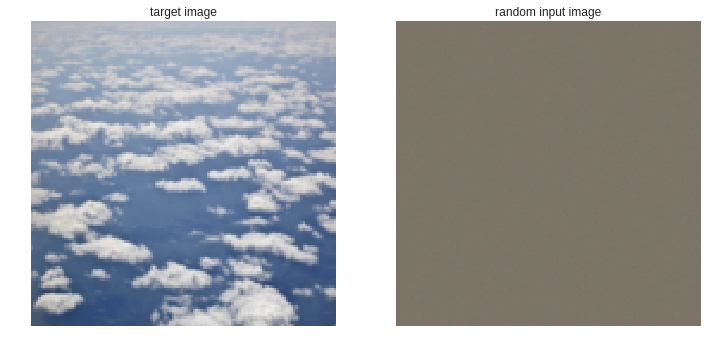

--------------------
********************
layer name: r11
********************
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------
Round 0, final loss: 574.610107421875
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------
Round 1, final loss: 516.0087280273438
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------
Round 2, final loss: 496.5841064453125
--------------------
Starting configuration
Random weights: True
Number of iterations: 100
Image size: torch.Size([1, 3, 128, 128])
Pooling type: max
--------------------
Round 3, final loss: 464.315673828125
--------------------
Starting configuration
Random weights: True
Number of iteratio

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:340: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:341: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 139577.250000
Iteration: 1000, loss: 130787.632812
Iteration: 1500, loss: 57776.835938
Iteration: 2000, loss: 0.054837
Iteration: 2500, loss: 0.007788
Iteration: 3000, loss: 0.003978
Iteration: 3500, loss: 0.002587
Iteration: 4000, loss: 0.001894
Iteration: 4500, loss: 0.001486
Iteration: 5000, loss: 0.001243
--------------------
Final output


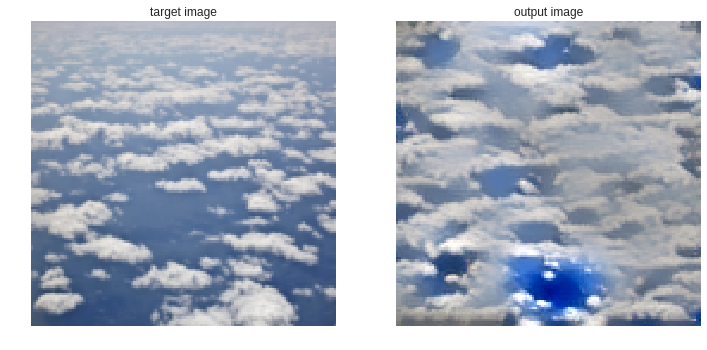

--------------------
CPU times: user 5min 34s, sys: 3min 2s, total: 8min 36s
Wall time: 8min 38s


In [40]:
%%time
out_fit_target, loss_fit_target, _ = texture_synthesis(target_img_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER)

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? False
Pooling type: max
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


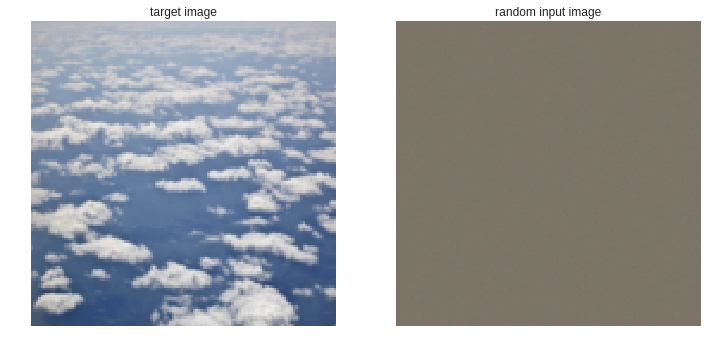

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:340: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:341: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 200701.234375
Iteration: 1000, loss: 138641.359375
Iteration: 1500, loss: 95657.445312
Iteration: 2000, loss: 95487.851562
Iteration: 2500, loss: 95302.117188
Iteration: 3000, loss: 95096.437500
Iteration: 3500, loss: 94865.351562
Iteration: 4000, loss: 94601.476562
Iteration: 4500, loss: 94296.476562
Iteration: 5000, loss: 93945.210938
--------------------
Final output


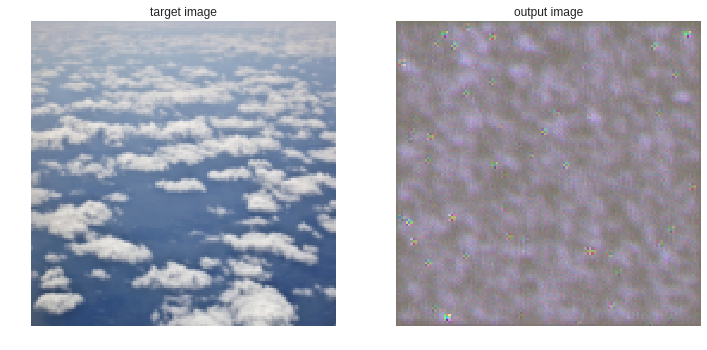

--------------------
CPU times: user 1min 23s, sys: 52.2 s, total: 2min 15s
Wall time: 2min 15s


In [41]:
%%time
out_unfitted, loss_unfitted, _ = texture_synthesis(target_img_filename, ranVGG=True,
                                 fit_on_target=False, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER)

In [1]:
plt.imshow(out_fit_target)
plt.axis("off")
out_fit_target.save(os.path.join(RESULT_DIR, "exp3-match.png"))
plt.imshow(out_unfitted)
plt.axis("off")
out_unfitted.save(os.path.join(RESULT_DIR, "exp3-no-match.png"))

NameError: ignored

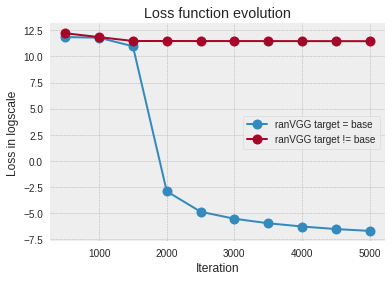

In [51]:
plt.style.use('bmh')
plt.plot(SHOW_ITER + np.arange(len(loss_fit_target)) * SHOW_ITER,
         np.log(loss_fit_target), label="ranVGG target = base",
         marker="o", markersize=10)
plt.plot(SHOW_ITER + np.arange(len(loss_unfitted)) * SHOW_ITER,
         np.log(loss_unfitted), label="ranVGG target != base",
         marker="o", markersize=10)
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Loss function evolution")
plt.legend(frameon=True)
plt.savefig(os.path.join(RESULT_DIR, "loss-experiment-1.svg"), format="svg")

**Comment:**
* We see on only one example how constructing ranVGG provides a better initialization. It requires about 5 minutes of additional pre-processing.

### Content vs Style layers

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? False
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


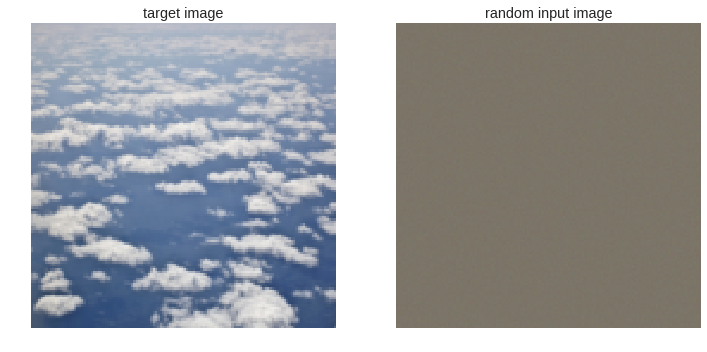

--------------------
********************
layer name: r11
********************
Round 0, final loss: 574.610107421875
Round 1, final loss: 516.0087280273438
Round 2, final loss: 496.5841064453125
Round 3, final loss: 464.315673828125
Round 4, final loss: 539.65576171875
********************
layer name: r12
********************
Round 0, final loss: 2.386439268420304e-09
Round 1, final loss: 2.4334956272298314e-09
Round 2, final loss: 2.995199421818029e-09
Round 3, final loss: 4.969283651234946e-09
Round 4, final loss: 3.2090323731637227e-09
********************
layer name: r21
********************
Round 0, final loss: 1.3970979125588201e-05
Round 1, final loss: 1.5600357073708437e-05
Round 2, final loss: 4.056359830428846e-05
Round 3, final loss: 4.071645889780484e-05
Round 4, final loss: 1.335495471721515e-05
********************
layer name: r22
********************
Round 0, final loss: 2.874760627746582
Round 1, final loss: 3.799038887023926
Round 2, final loss: 3.2120463848114014
Roun

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:433: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:434: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 139693.312500
Iteration: 1000, loss: 130805.476562
Iteration: 1500, loss: 81788.390625
Iteration: 2000, loss: 77979.367188
Iteration: 2500, loss: 72981.664062
Iteration: 3000, loss: 66697.875000
Iteration: 3500, loss: 0.055315
Iteration: 4000, loss: 0.003639
Iteration: 4500, loss: 0.001586
Iteration: 5000, loss: 0.000988
--------------------
Final output


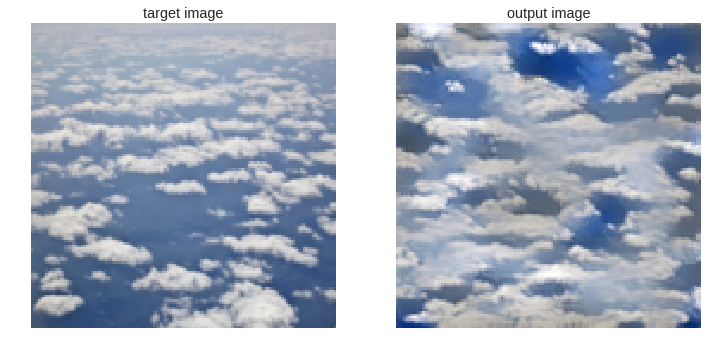

--------------------
CPU times: user 4min 38s, sys: 2min 40s, total: 7min 18s
Wall time: 7min 20s


In [64]:
%%time
out_content, loss_content, _ = texture_synthesis(target_img_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, layer_type="content")

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? False
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


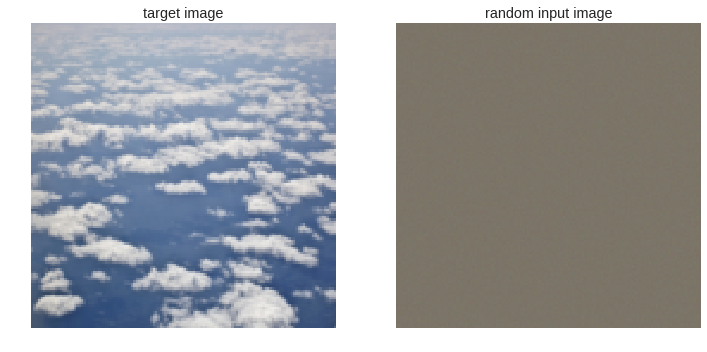

--------------------
********************
layer name: r11
********************
Round 0, final loss: 251679.375
Round 1, final loss: 190564.515625
Round 2, final loss: 175264.640625
Round 3, final loss: 139629.4375
Round 4, final loss: 200578.09375
********************
layer name: r12
********************
Round 0, final loss: 3566.228759765625
Round 1, final loss: 4378.64404296875
Round 2, final loss: 4805.71337890625
Round 3, final loss: 5716.0068359375
Round 4, final loss: 6678.46630859375
********************
layer name: r21
********************
Round 0, final loss: 93.03457641601562
Round 1, final loss: 140.08079528808594
Round 2, final loss: 210.42108154296875
Round 3, final loss: 181.3245849609375
Round 4, final loss: 209.93878173828125
********************
layer name: r22
********************
Round 0, final loss: 2.1487882137298584
Round 1, final loss: 2.390425205230713
Round 2, final loss: 3.704212188720703
Round 3, final loss: 1.440978765487671
Round 4, final loss: 2.3123798370

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:433: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:434: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 139577.250000
Iteration: 1000, loss: 130787.632812
Iteration: 1500, loss: 0.206202
Iteration: 2000, loss: 0.013221
Iteration: 2500, loss: 0.003635
Iteration: 3000, loss: 0.001721
Iteration: 3500, loss: 0.001033
Iteration: 4000, loss: 0.000715
Iteration: 4500, loss: 0.000544
Iteration: 5000, loss: 0.000437
--------------------
Final output


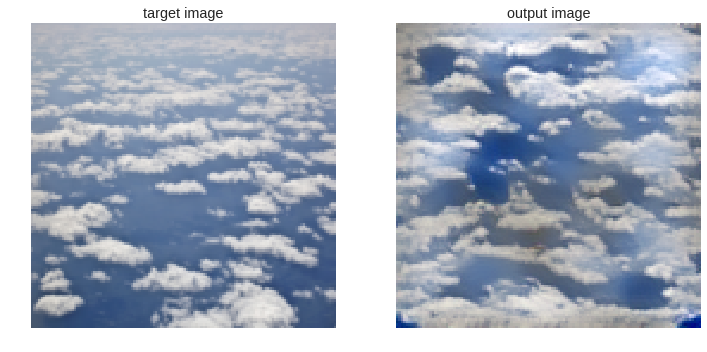

--------------------
CPU times: user 5min 38s, sys: 3min 3s, total: 8min 42s
Wall time: 8min 44s


In [67]:
%%time
out_style, loss_style, _ = texture_synthesis(target_img_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, layer_type="style")

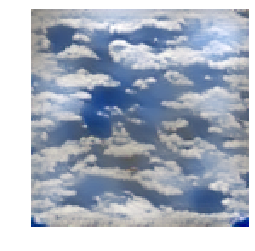

In [96]:
plt.imshow(out_content)
plt.axis("off")
out_content.save(os.path.join(RESULT_DIR, "exp4-content.png"))
plt.imshow(out_style)
plt.axis("off")
out_style.save(os.path.join(RESULT_DIR, "exp4-style.png"))

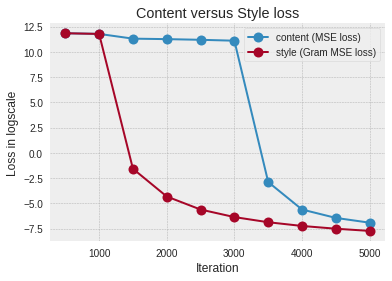

In [70]:
plt.style.use('bmh')
plt.plot(SHOW_ITER + np.arange(len(loss_content)) * SHOW_ITER,
         np.log(loss_content), label="content (MSE loss)",
         marker="o", markersize=10)
plt.plot(SHOW_ITER + np.arange(len(loss_style)) * SHOW_ITER,
         np.log(loss_style), label="style (Gram MSE loss)",
         marker="o", markersize=10)
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Content versus Style loss")
plt.legend(frameon=True)
plt.savefig(os.path.join(RESULT_DIR, "loss-experiment-3.svg"), format="svg")

**Comment:**
* Based on the result we keep the ranVGG construction method based on the "style" loss.

### Random VGG vs ranVGG

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? False
Fit ranVGG on target? False
Pooling type: max
Compute weighting factors on style layers? False
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


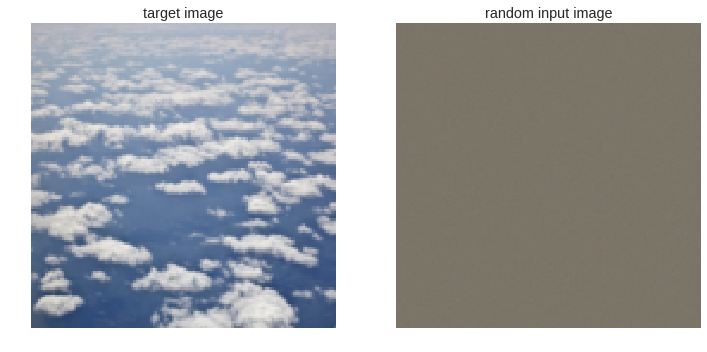

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:433: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:434: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 209160.843750
Iteration: 1000, loss: 152498.593750
Iteration: 1500, loss: 105157.460938
Iteration: 2000, loss: 103818.750000
Iteration: 2500, loss: 102305.023438
Iteration: 3000, loss: 100501.437500
Iteration: 3500, loss: 98260.992188
Iteration: 4000, loss: 95446.546875
Iteration: 4500, loss: 91903.226562
Iteration: 5000, loss: 87602.054688
--------------------
Final output


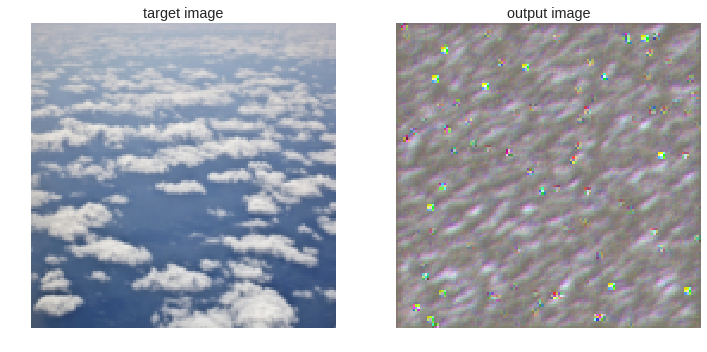

--------------------
CPU times: user 1min 24s, sys: 51.2 s, total: 2min 15s
Wall time: 2min 15s


In [72]:
%%time
random_output, random_loss, _ = texture_synthesis(target_img_filename, 
                                               random_weights=True, 
                                               max_iter=MAX_ITER,
                                               show_iter=SHOW_ITER)

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? False
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


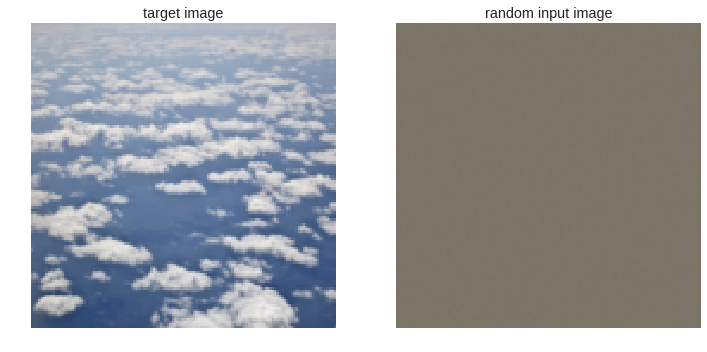

--------------------
********************
layer name: r11
********************
Round 0, final loss: 60902.75390625
Round 1, final loss: 303691.84375
Round 2, final loss: 348346.75
Round 3, final loss: 106933.5
Round 4, final loss: 420091.25
********************
layer name: r12
********************
Round 0, final loss: 886.1089477539062
Round 1, final loss: 2767.72900390625
Round 2, final loss: 1148.98046875
Round 3, final loss: 911.2903442382812
Round 4, final loss: 655.0296020507812
********************
layer name: r21
********************
Round 0, final loss: 15.114593505859375
Round 1, final loss: 42.943660736083984
Round 2, final loss: 49.00233840942383
Round 3, final loss: 26.6923770904541
Round 4, final loss: 43.15312957763672
********************
layer name: r22
********************
Round 0, final loss: 0.4658684730529785
Round 1, final loss: 0.6513581275939941
Round 2, final loss: 0.2744353711605072
Round 3, final loss: 0.39207959175109863
Round 4, final loss: 0.732996225357055

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:433: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:434: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 60901.218750
Iteration: 1000, loss: 60834.234375
Iteration: 1500, loss: 60573.109375
Iteration: 2000, loss: 59496.515625
Iteration: 2500, loss: 55168.476562
Iteration: 3000, loss: 41571.515625
Iteration: 3500, loss: 16562.707031
Iteration: 4000, loss: 0.004331
Iteration: 4500, loss: 0.001403
Iteration: 5000, loss: 0.000790
--------------------
Final output


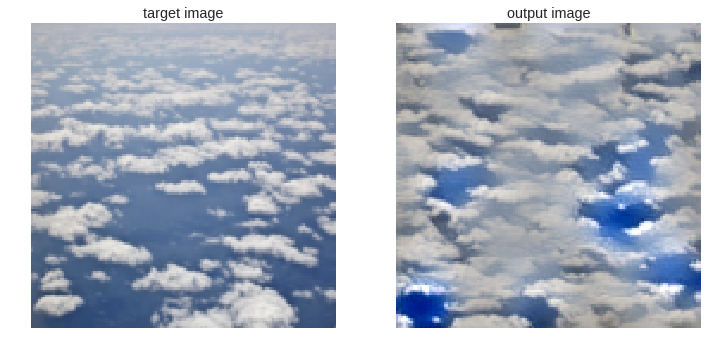

--------------------
CPU times: user 4min 23s, sys: 2min 35s, total: 6min 59s
Wall time: 7min


In [73]:
%%time
out_ranVGG, loss_ranVGG, _ = texture_synthesis(target_img_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, layer_type="style")

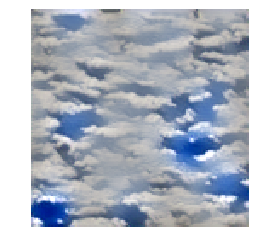

In [95]:
plt.imshow(random_output)
plt.axis("off")
random_output.save(os.path.join(RESULT_DIR, "exp2-randomVGG.png"))
plt.imshow(out_ranVGG)
plt.axis("off")
out_ranVGG.save(os.path.join(RESULT_DIR, "exp2-ranVGG.png"))

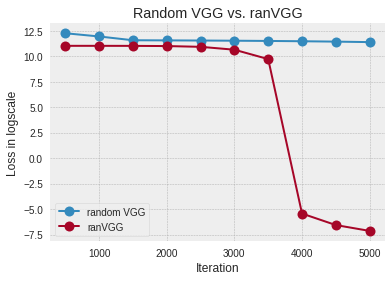

In [81]:
plt.style.use('bmh')
plt.plot(SHOW_ITER + np.arange(len(random_loss)) * SHOW_ITER,
         np.log(random_loss), label="random VGG",
         marker="o", markersize=10)
plt.plot(SHOW_ITER + np.arange(len(loss_ranVGG)) * SHOW_ITER,
         np.log(loss_ranVGG), label="ranVGG",
         marker="o", markersize=10)
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Random VGG vs. ranVGG")
plt.legend(frameon=True)
plt.savefig(os.path.join(RESULT_DIR, "loss-experiment-2.svg"), format="svg")

**Comment:**
* ranVGG outperforms a randomly initialized network.

### Normalized weights preprocessing vs non-normalized weights on ranVGG?

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


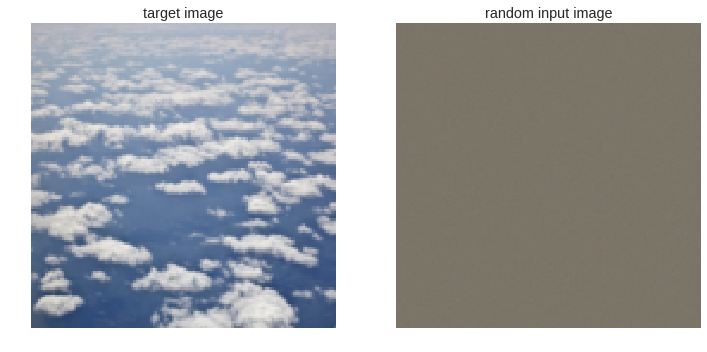

--------------------
********************
layer name: r11
********************
Round 0, final loss: 854.1470947265625
Round 1, final loss: 727.0792846679688
Round 2, final loss: 587.2118530273438
Round 3, final loss: 683.014404296875
Round 4, final loss: 689.1972045898438
********************
layer name: r12
********************
Round 0, final loss: 1.3088478079126276e-09
Round 1, final loss: 4.091821992346922e-09
Round 2, final loss: 9.18475739908331e-10
Round 3, final loss: 2.577654756308334e-09
Round 4, final loss: 2.707871704643594e-09
********************
layer name: r21
********************
Round 0, final loss: 3.6358976274186716e-08
Round 1, final loss: 4.774465267587402e-08
Round 2, final loss: 3.24144515673197e-08
Round 3, final loss: 6.63672992118336e-08
Round 4, final loss: 2.006412614719011e-05
********************
layer name: r22
********************
Round 0, final loss: 3.9658429622650146
Round 1, final loss: 4.5430989265441895
Round 2, final loss: 3.7312471866607666
Roun

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 18.028658
Iteration: 1000, loss: 7.613645
Iteration: 1500, loss: 4.636031
Iteration: 2000, loss: 3.231356
Iteration: 2500, loss: 2.372151
Iteration: 3000, loss: 1.848379
Iteration: 3500, loss: 1.537663
Iteration: 4000, loss: 1.351520
Iteration: 4500, loss: 1.209429
Iteration: 5000, loss: 1.089342
--------------------
Final output


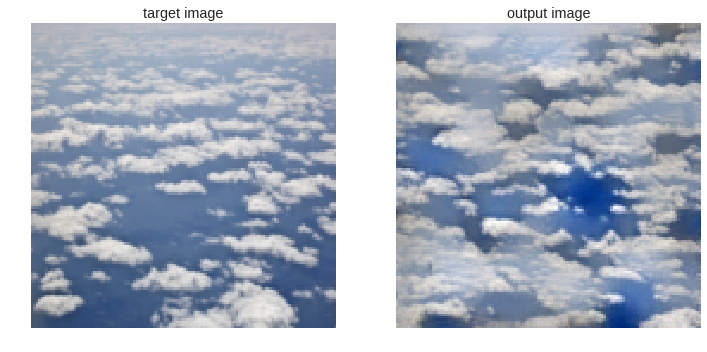

--------------------


In [79]:
output_norm, loss_norm, _ = texture_synthesis(target_img_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, compute_weight_factors=True)

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? False
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


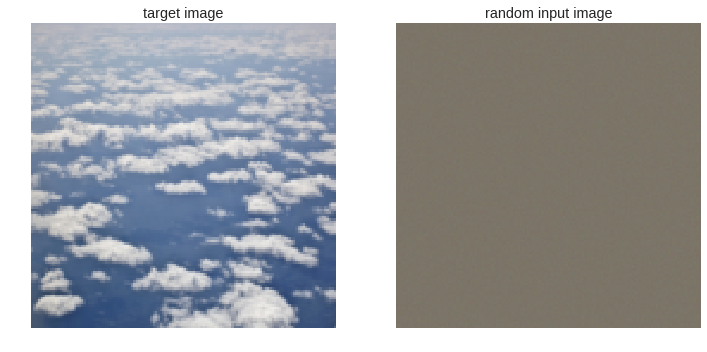

--------------------
********************
layer name: r11
********************
Round 0, final loss: 574.610107421875
Round 1, final loss: 516.0087280273438
Round 2, final loss: 496.5841064453125
Round 3, final loss: 464.315673828125
Round 4, final loss: 539.65576171875
********************
layer name: r12
********************
Round 0, final loss: 7.908723675953411e-10
Round 1, final loss: 2.4240731644198377e-09
Round 2, final loss: 2.9753677299737546e-09
Round 3, final loss: 4.971572042933303e-09
Round 4, final loss: 3.1948186318686567e-09
********************
layer name: r21
********************
Round 0, final loss: 1.8901693692896515e-05
Round 1, final loss: 2.8599873985513113e-05
Round 2, final loss: 0.0001461450447095558
Round 3, final loss: 1.3519764252123423e-05
Round 4, final loss: 2.3657747078686953e-05
********************
layer name: r22
********************
Round 0, final loss: 2.2236826419830322
Round 1, final loss: 3.1168901920318604
Round 2, final loss: 2.9709537029266357

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:433: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:434: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 139664.484375
Iteration: 1000, loss: 130785.437500
Iteration: 1500, loss: 78975.820312
Iteration: 2000, loss: 73737.695312
Iteration: 2500, loss: 65232.050781
Iteration: 3000, loss: 50493.714844
Iteration: 3500, loss: 0.055295
Iteration: 4000, loss: 0.007332
Iteration: 4500, loss: 0.002797
Iteration: 5000, loss: 0.001532
--------------------
Final output


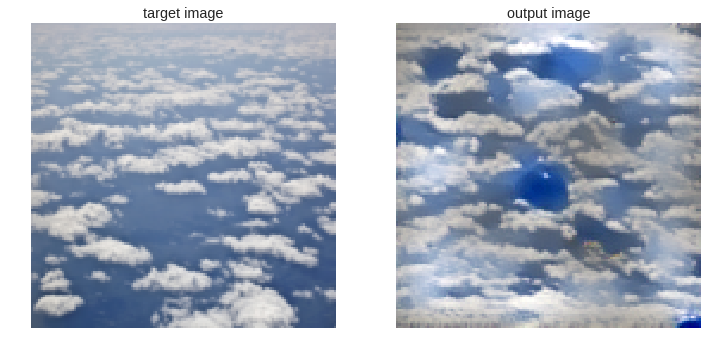

--------------------


In [80]:
output_not_norm, loss_not_norm, _ = texture_synthesis(target_img_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER)

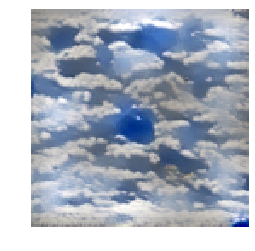

In [97]:
plt.imshow(output_norm)
plt.axis("off")
output_norm.save(os.path.join(RESULT_DIR, "exp5-normalization.png"))
plt.imshow(output_not_norm)
plt.axis("off")
output_not_norm.save(os.path.join(RESULT_DIR, "exp5-no_normalization.png"))

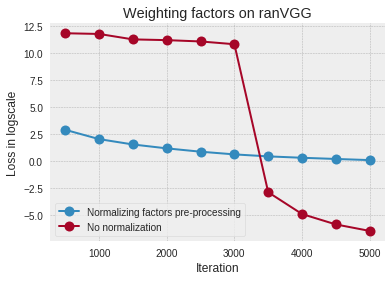

In [83]:
plt.style.use('bmh')
plt.plot(SHOW_ITER + np.arange(len(loss_norm)) * SHOW_ITER,
         np.log(loss_norm), label="Normalizing factors pre-processing",
         marker="o", markersize=10)
plt.plot(SHOW_ITER + np.arange(len(loss_not_norm)) * SHOW_ITER,
         np.log(loss_not_norm), label="No normalization",
         marker="o", markersize=10)
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Weighting factors on ranVGG")
plt.legend(frameon=True)
plt.savefig(os.path.join(RESULT_DIR, "loss-experiment-5.svg"), format="svg")

**Comment:**
* Normalizing the weights seems to prevent gray patches to form.

### BONUS: Normalized weights preprocessing vs normalization every S epochs on ranVGG?

### BONUS: Compare init "random", "zero", "RPN"

### ranVGG MAX vs AVG pooling

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


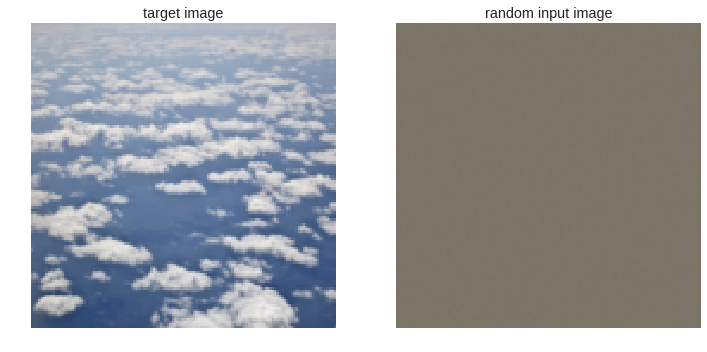

--------------------
********************
layer name: r11
********************
Round 0, final loss: 312.60589599609375
Round 1, final loss: 9.310066606538214e-10
Round 2, final loss: 675.1266479492188
Round 3, final loss: 399.1352844238281
Round 4, final loss: 738.4248046875
********************
layer name: r12
********************
Round 0, final loss: 4.4062344883855076e-09
Round 1, final loss: 4.899150862769375e-09
Round 2, final loss: 3.3515559216823476e-09
Round 3, final loss: 5.275177628050187e-09
Round 4, final loss: 1.1013798761894122e-09
********************
layer name: r21
********************
Round 0, final loss: 0.00010510446736589074
Round 1, final loss: 1.7900274542625993e-06
Round 2, final loss: 2.1218223992036656e-05
Round 3, final loss: 4.055184945173096e-06
Round 4, final loss: 1.2236110705998726e-05
********************
layer name: r22
********************
Round 0, final loss: 5.597083568572998
Round 1, final loss: 3.959719181060791
Round 2, final loss: 4.440190315246

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 31.778013
Iteration: 1000, loss: 10.994876
Iteration: 1500, loss: 5.539993
Iteration: 2000, loss: 3.916824
Iteration: 2500, loss: 3.081802
Iteration: 3000, loss: 2.597218
Iteration: 3500, loss: 2.229359
Iteration: 4000, loss: 1.953188
Iteration: 4500, loss: 1.732849
Iteration: 5000, loss: 1.580911
--------------------
Final output


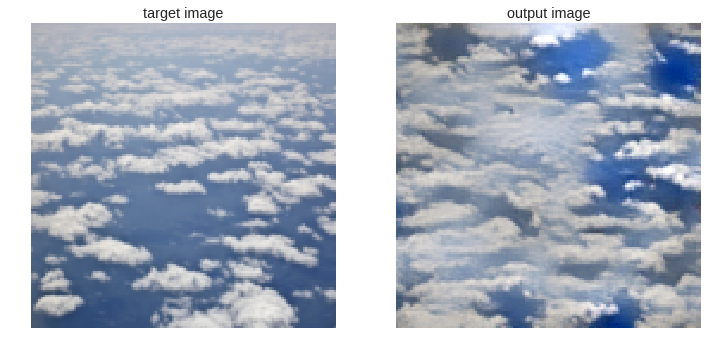

--------------------


In [91]:
output_max, loss_max, _ = texture_synthesis(target_img_filename, ranVGG=True, pool="max",
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, compute_weight_factors=True)

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: avg
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


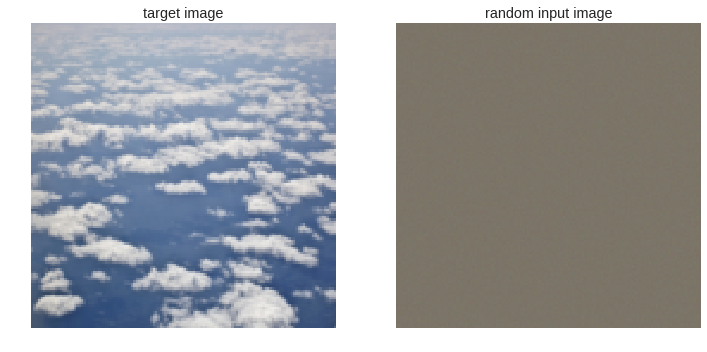

--------------------
********************
layer name: r11
********************
Round 0, final loss: 574.610107421875
Round 1, final loss: 516.0087280273438
Round 2, final loss: 496.5841064453125
Round 3, final loss: 464.315673828125
Round 4, final loss: 539.65576171875
********************
layer name: r12
********************
Round 0, final loss: 2.3255890546636238e-09
Round 1, final loss: 2.4506596751905363e-09
Round 2, final loss: 2.9356634900779e-09
Round 3, final loss: 5.001036917917645e-09
Round 4, final loss: 3.2126292737189033e-09
********************
layer name: r21
********************
Round 0, final loss: 1.4112391909293365e-05
Round 1, final loss: 6.419444252969697e-05
Round 2, final loss: 2.322452564840205e-05
Round 3, final loss: 3.638334237621166e-05
Round 4, final loss: 2.2881327822688036e-05
********************
layer name: r22
********************
Round 0, final loss: 1.7012501955032349
Round 1, final loss: 1.8313654661178589
Round 2, final loss: 2.1717450618743896
Rou

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 23.749907
Iteration: 1000, loss: 9.331897
Iteration: 1500, loss: 5.422336
Iteration: 2000, loss: 3.604747
Iteration: 2500, loss: 2.762275
Iteration: 3000, loss: 2.231809
Iteration: 3500, loss: 1.895739
Iteration: 4000, loss: 1.654148
Iteration: 4500, loss: 1.437781
Iteration: 5000, loss: 1.294915
--------------------
Final output


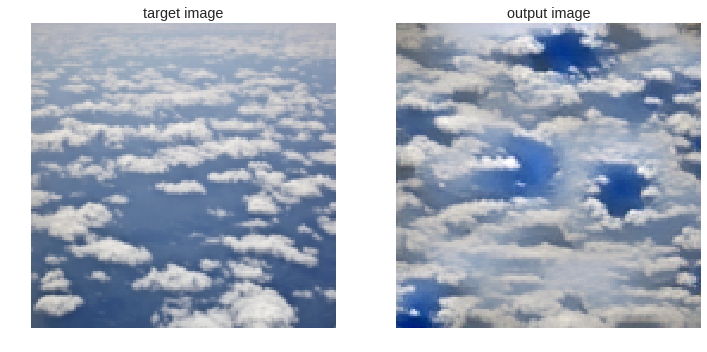

--------------------


In [92]:
output_avg, loss_avg, _ = texture_synthesis(target_img_filename, ranVGG=True, pool="avg",
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, compute_weight_factors=True)

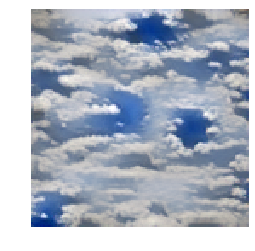

In [98]:
plt.imshow(output_max)
plt.axis("off")
output_max.save(os.path.join(RESULT_DIR, "exp6-max.png"))
plt.imshow(output_avg)
plt.axis("off")
output_avg.save(os.path.join(RESULT_DIR, "exp6-avg.png"))

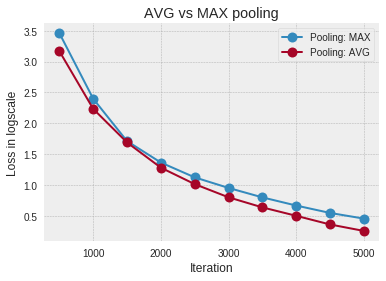

In [94]:
plt.style.use('bmh')
plt.plot(SHOW_ITER + np.arange(len(loss_max)) * SHOW_ITER,
         np.log(loss_max), label="Pooling: MAX",
         marker="o", markersize=10)
plt.plot(SHOW_ITER + np.arange(len(loss_avg)) * SHOW_ITER,
         np.log(loss_avg), label="Pooling: AVG",
         marker="o", markersize=10)
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("AVG vs MAX pooling")
plt.legend(frameon=True)
plt.savefig(os.path.join(RESULT_DIR, "loss-experiment-6.svg"), format="svg")

**Comment:**
* The difference is not noticeable on this texture.

### BONUS: Try different style layers

### BONUS: Try style transfer weights from Gatys

### Compare trained VGG and ranVGG on a few textures

In [ ]:
camouflage_filename = "TexturesCom_Camouflage0005_seamless_S.jpg"

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


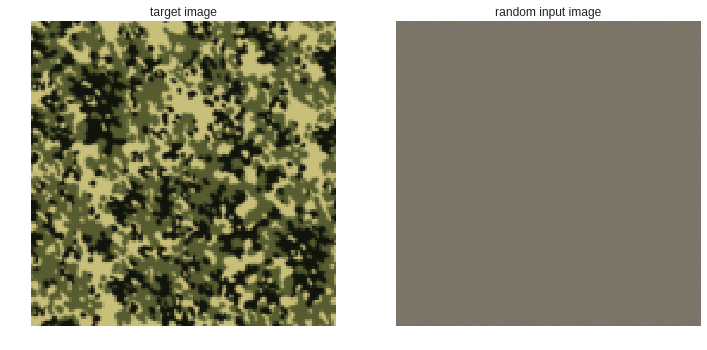

--------------------
********************
layer name: r11
********************
Round 0, final loss: 529.6340942382812
Round 1, final loss: 395.081298828125
Round 2, final loss: 624.5078735351562
Round 3, final loss: 676.4714965820312
Round 4, final loss: 518.9542846679688
********************
layer name: r12
********************
Round 0, final loss: 1.6769113875270136e-09
Round 1, final loss: 2.661181053298378e-09
Round 2, final loss: 3.795532332873108e-09
Round 3, final loss: 2.533360410339469e-09
Round 4, final loss: 7.247122901787861e-10
********************
layer name: r21
********************
Round 0, final loss: 0.001328670303337276
Round 1, final loss: 7.730510986903028e-08
Round 2, final loss: 0.003317863680422306
Round 3, final loss: 4.2713905713753775e-05
Round 4, final loss: 7.383131617189065e-08
********************
layer name: r22
********************
Round 0, final loss: 3.2002511024475098
Round 1, final loss: 3.433899402618408
Round 2, final loss: 2.402841091156006
Round

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 41.067230
Iteration: 1000, loss: 10.756776
Iteration: 1500, loss: 5.318771
Iteration: 2000, loss: 3.387536
Iteration: 2500, loss: 2.428075
Iteration: 3000, loss: 1.884486
Iteration: 3500, loss: 1.550184
Iteration: 4000, loss: 1.315601
Iteration: 4500, loss: 1.136385
Iteration: 5000, loss: 1.001327
--------------------
Final output


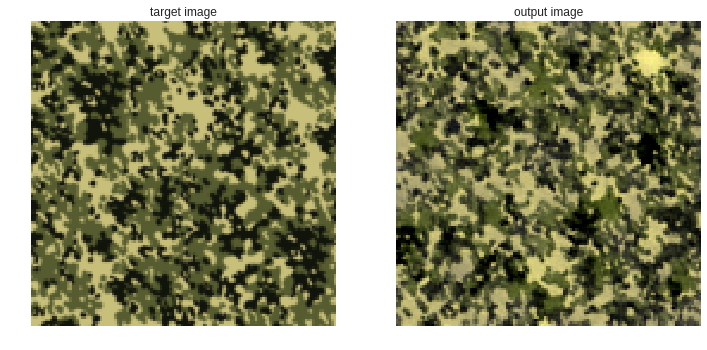

--------------------


In [20]:
out_ranVGG_camouflage, loss_ranVGG_camouflage, _ = texture_synthesis(camouflage_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, compute_weight_factors=True)

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: False
ranVGG? False
Fit ranVGG on target? False
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


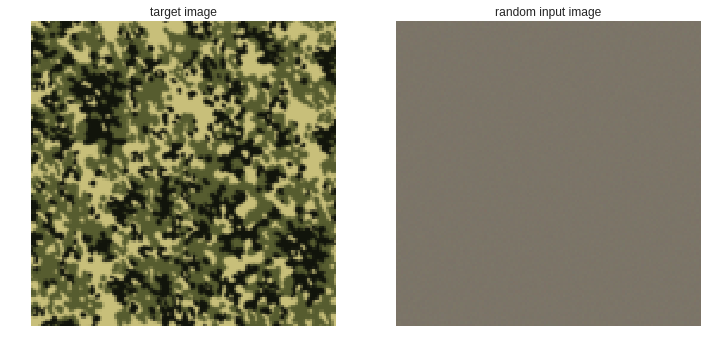

--------------------
Normalization factors:
95.27549081337628
0.1522807158693542
0.129247613391153
0.00041390787033285026
46.375573873752785


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 1830711.000000
Iteration: 1000, loss: 895067.750000
Iteration: 1500, loss: 621476.125000
Iteration: 2000, loss: 500753.750000
Iteration: 2500, loss: 431579.781250
Iteration: 3000, loss: 388024.875000
Iteration: 3500, loss: 365347.187500
Iteration: 4000, loss: 352580.468750
Iteration: 4500, loss: 344221.000000
Iteration: 5000, loss: 336767.625000
--------------------
Final output


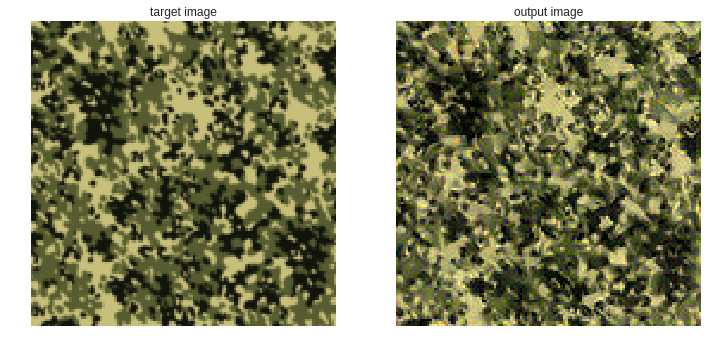

--------------------


In [21]:
out_trained_camouflage, loss_trained_camouflage, _ = texture_synthesis(camouflage_filename, random_weights=False,
                                                                       ranVGG=False, max_iter=MAX_ITER, show_iter=SHOW_ITER,
                                                                       compute_weight_factors=True)

In [ ]:
cambodia_filename = "TexturesCom_OrnamentsCambodia0055_1_S.jpg"

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


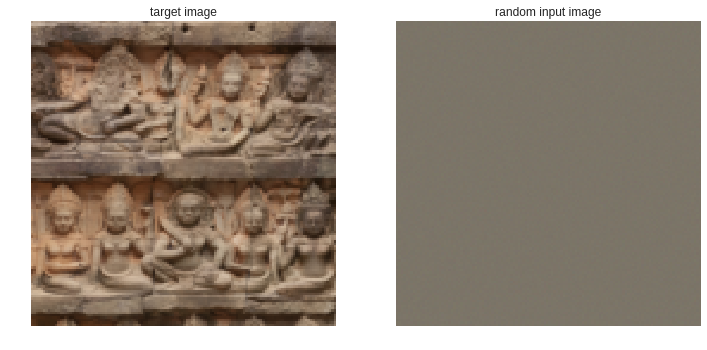

--------------------
********************
layer name: r11
********************
Round 0, final loss: 210.72364807128906
Round 1, final loss: 187.4885711669922
Round 2, final loss: 290.8114929199219
Round 3, final loss: 313.75439453125
Round 4, final loss: 245.63438415527344
********************
layer name: r12
********************
Round 0, final loss: 2.3853539143914304e-09
Round 1, final loss: 6.328225055085568e-09
Round 2, final loss: 3.533689341139734e-09
Round 3, final loss: 2.385091457668409e-09
Round 4, final loss: 3.88535870143869e-09
********************
layer name: r21
********************
Round 0, final loss: 0.000751000945456326
Round 1, final loss: 0.0002461363619659096
Round 2, final loss: 0.00022079584596212953
Round 3, final loss: 0.0012208716943860054
Round 4, final loss: 0.0004885740927420557
********************
layer name: r22
********************
Round 0, final loss: 1.3401885032653809
Round 1, final loss: 1.2843899726867676
Round 2, final loss: 1.5864496231079102
Ro

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 12.474083
Iteration: 1000, loss: 3.443357
Iteration: 1500, loss: 1.640213
Iteration: 2000, loss: 0.960798
Iteration: 2500, loss: 0.651014
Iteration: 3000, loss: 0.484346
Iteration: 3500, loss: 0.379521
Iteration: 4000, loss: 0.310359
Iteration: 4500, loss: 0.260795
Iteration: 5000, loss: 0.224683
--------------------
Final output


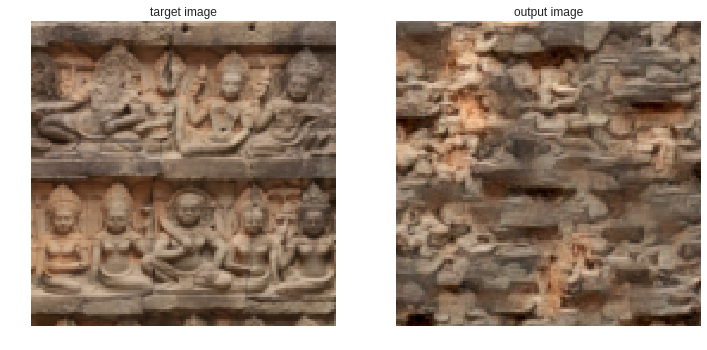

--------------------


In [29]:
out_ranVGG_cambodia, loss_ranVGG_cambodia, _ = texture_synthesis(cambodia_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, compute_weight_factors=True)

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: False
ranVGG? False
Fit ranVGG on target? False
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


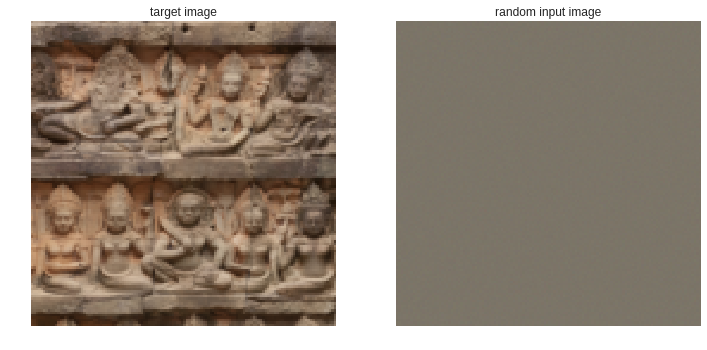

--------------------
Normalization factors:
291.1312671735711
0.42475216231688445
0.42305829409518386
0.0015897334887101172
110.08064720839504


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 28426140.000000
Iteration: 1000, loss: 24308580.000000
Iteration: 1500, loss: 23163660.000000
Iteration: 2000, loss: 22608270.000000
Iteration: 2500, loss: 22328630.000000
Iteration: 3000, loss: 22183996.000000
Iteration: 3500, loss: 22095438.000000
Iteration: 4000, loss: 22015528.000000
Iteration: 4500, loss: 21962692.000000
Iteration: 5000, loss: 21924072.000000
--------------------
Final output


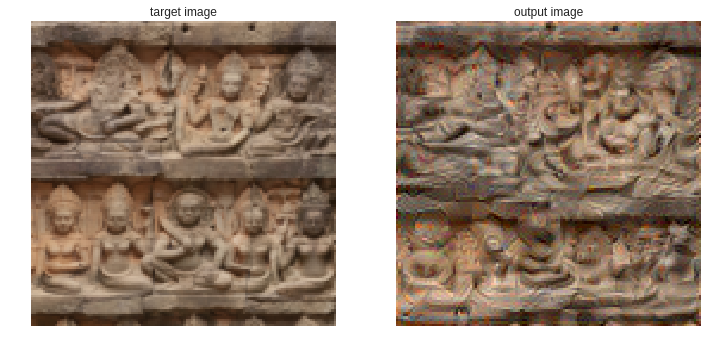

--------------------


In [30]:
out_trained_cambodia, loss_trained_cambodia, _ = texture_synthesis(cambodia_filename, random_weights=False,
                                                                       ranVGG=False, max_iter=MAX_ITER, show_iter=SHOW_ITER,
                                                                       compute_weight_factors=True)

In [ ]:
night_filename = "TexturesCom_BokehNight0047_S.jpg"

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


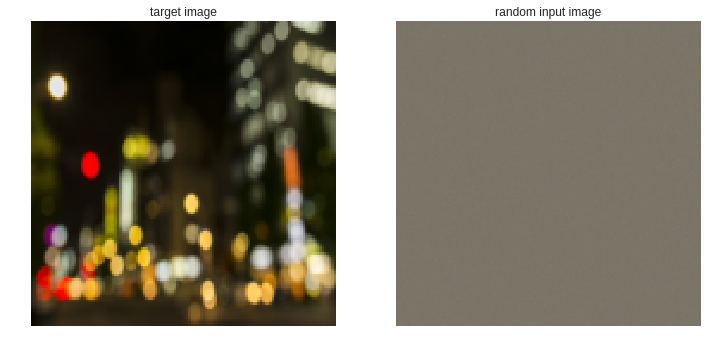

--------------------
********************
layer name: r11
********************
Round 0, final loss: 934.4170532226562
Round 1, final loss: 815.3256225585938
Round 2, final loss: 3.9059949719089104e-10
Round 3, final loss: 1077.633544921875
Round 4, final loss: 857.022216796875
********************
layer name: r12
********************
Round 0, final loss: 8.108974824949655e-09
Round 1, final loss: 5.127131608162472e-09
Round 2, final loss: 1.3417592592546157e-09
Round 3, final loss: 2.175215563227084e-09
Round 4, final loss: 1.1914513819988315e-08
********************
layer name: r21
********************
Round 0, final loss: 5.821753461532353e-07
Round 1, final loss: 1.0422290870337747e-06
Round 2, final loss: 2.8245053727005143e-06
Round 3, final loss: 5.818969839310739e-07
Round 4, final loss: 1.0959824976453092e-06
********************
layer name: r22
********************
Round 0, final loss: 6.609800815582275
Round 1, final loss: 6.155447006225586
Round 2, final loss: 4.719709396362

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 39.043777
Iteration: 1000, loss: 16.565823
Iteration: 1500, loss: 10.501128
Iteration: 2000, loss: 7.810126
Iteration: 2500, loss: 6.209916
Iteration: 3000, loss: 5.153602
Iteration: 3500, loss: 4.477155
Iteration: 4000, loss: 4.010133
Iteration: 4500, loss: 3.675845
Iteration: 5000, loss: 3.409039
--------------------
Final output


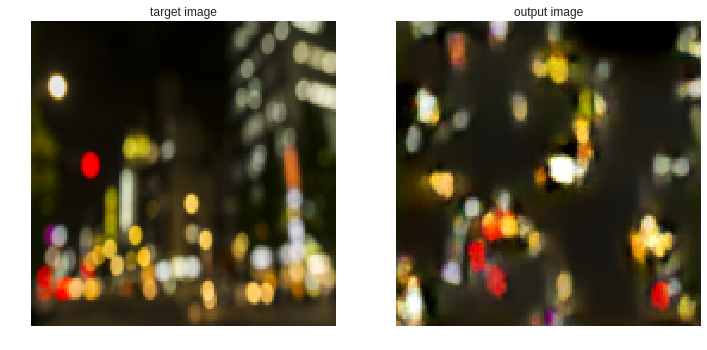

--------------------


In [32]:
out_ranVGG_night, loss_ranVGG_night, _ = texture_synthesis(night_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, compute_weight_factors=True)

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: False
ranVGG? False
Fit ranVGG on target? False
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


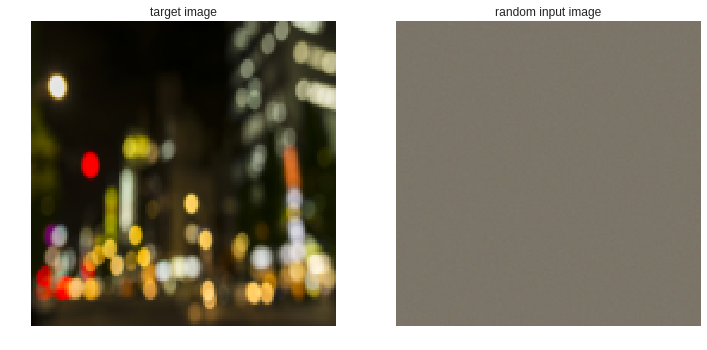

--------------------
Normalization factors:
66.88519989156262
0.3496935650792669
0.21262697761961633
0.0009076021764282464
71.84271040339212


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 93838928.000000
Iteration: 1000, loss: 56225112.000000
Iteration: 1500, loss: 48382736.000000
Iteration: 2000, loss: 45123024.000000
Iteration: 2500, loss: 43327244.000000
Iteration: 3000, loss: 40872952.000000
Iteration: 3500, loss: 39158128.000000
Iteration: 4000, loss: 38011164.000000
Iteration: 4500, loss: 37019600.000000
Iteration: 5000, loss: 36183600.000000
--------------------
Final output


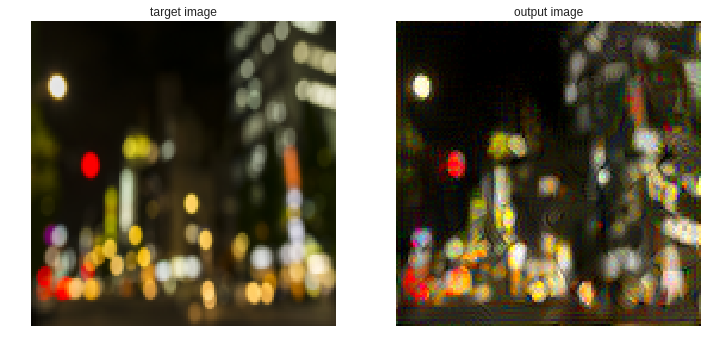

--------------------


In [33]:
out_trained_night, loss_trained_night, _ = texture_synthesis(night_filename, random_weights=False,
                                                                       ranVGG=False, max_iter=MAX_ITER, show_iter=SHOW_ITER,
                                                                       compute_weight_factors=True)

In [ ]:
brick_filename = "TexturesCom_BrickLargeBlocks0021_1_seamless_S.jpg"

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: True
ranVGG? True
Fit ranVGG on target? True
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


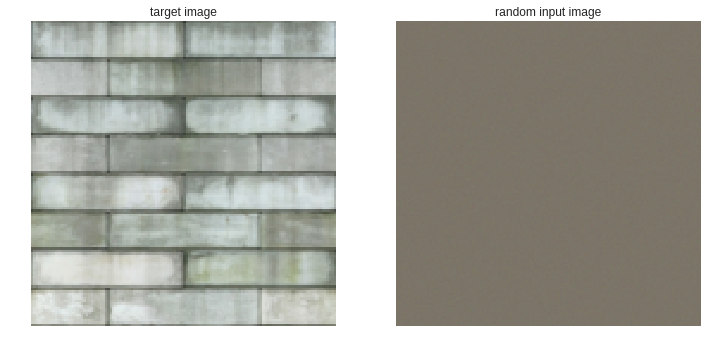

--------------------
********************
layer name: r11
********************
Round 0, final loss: 891.5969848632812
Round 1, final loss: 712.3129272460938
Round 2, final loss: 606.7066040039062
Round 3, final loss: 699.6526489257812
Round 4, final loss: 705.5419921875
********************
layer name: r12
********************
Round 0, final loss: 1.0678933293206683e-09
Round 1, final loss: 7.0336749757871075e-09
Round 2, final loss: 5.3054614035374925e-09
Round 3, final loss: 1.2372380897573976e-09
Round 4, final loss: 5.60251178782778e-09
********************
layer name: r21
********************
Round 0, final loss: 2.0511513866949826e-05
Round 1, final loss: 3.564392159205454e-08
Round 2, final loss: 3.434818651726346e-08
Round 3, final loss: 2.8343796643071073e-08
Round 4, final loss: 2.0536527145509353e-08
********************
layer name: r22
********************
Round 0, final loss: 4.589217185974121
Round 1, final loss: 4.488099575042725
Round 2, final loss: 3.3653273582458496
R

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 10.254999
Iteration: 1000, loss: 3.574211
Iteration: 1500, loss: 2.061890
Iteration: 2000, loss: 1.350099
Iteration: 2500, loss: 0.974231
Iteration: 3000, loss: 0.772126
Iteration: 3500, loss: 0.648878
Iteration: 4000, loss: 0.565943
Iteration: 4500, loss: 0.509893
Iteration: 5000, loss: 0.464024
--------------------
Final output


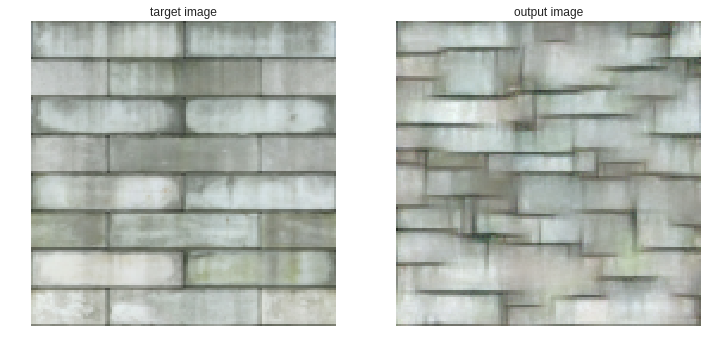

--------------------


In [36]:
out_ranVGG_brick, loss_ranVGG_brick, _ = texture_synthesis(brick_filename, ranVGG=True,
                                 fit_on_target=True, max_iter=MAX_ITER,
                                 show_iter=SHOW_ITER, compute_weight_factors=True)

--------------------
Starting configuration
Image size: torch.Size([1, 3, 128, 128])
Random weights: False
ranVGG? False
Fit ranVGG on target? False
Pooling type: max
Compute weighting factors on style layers? True
Number of iterations: 5000
Loss display every 500 iterations
Compute RPN loss? False
--------------------


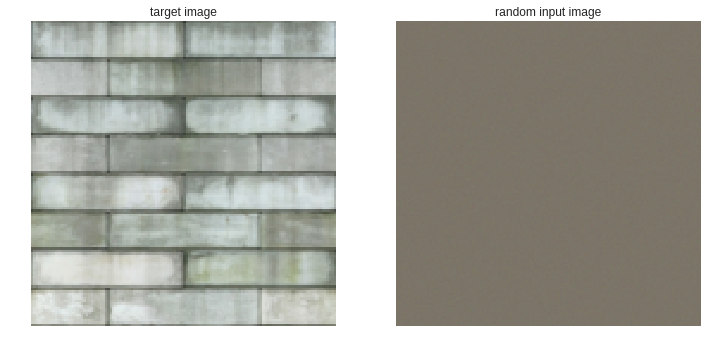

--------------------
Normalization factors:
73.96962024758363
1.285523045291864
1.0355016270195478
0.002514534273613221
172.08611695598455


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:413: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:414: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 9542397.000000
Iteration: 1000, loss: 4815566.000000
Iteration: 1500, loss: 3289229.000000
Iteration: 2000, loss: 2394690.250000
Iteration: 2500, loss: 1910968.625000
Iteration: 3000, loss: 1707063.250000
Iteration: 3500, loss: 1543136.625000
Iteration: 4000, loss: 1359600.500000
Iteration: 4500, loss: 1291278.000000
Iteration: 5000, loss: 1248685.250000
--------------------
Final output


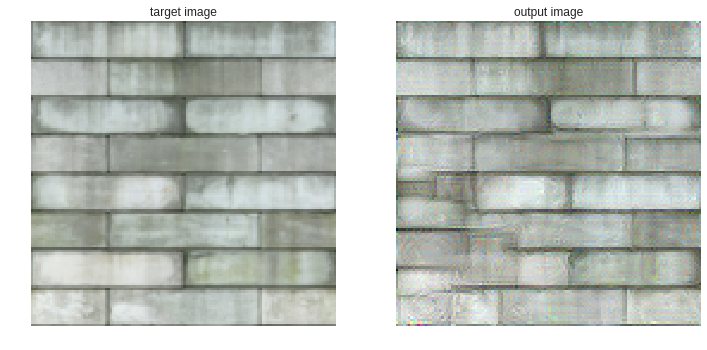

--------------------
CPU times: user 4min 25s, sys: 1min 55s, total: 6min 21s
Wall time: 6min 21s


In [39]:
%%time
out_trained_brick, loss_trained_brick, _ = texture_synthesis(brick_filename, random_weights=False,
                                                                       ranVGG=False, max_iter=MAX_ITER, show_iter=SHOW_ITER,
                                                                       compute_weight_factors=True)

In [ ]:
# TODO: Save outputs and display loss functions

out_trained_night.save(os.path.join(RESULT_DIR, "exp7-trained-night.png"))
out_trained_cambodia.save(os.path.join(RESULT_DIR, "exp7-trained-cambodia.png"))
out_trained_camouflage.save(os.path.join(RESULT_DIR, "exp7-trained-camouflage.png"))
out_trained_brick.save(os.path.join(RESULT_DIR, "exp7-trained-brick.png"))

out_ranVGG_night.save(os.path.join(RESULT_DIR, "exp7-ranVGG-night.png"))
out_ranVGG_cambodia.save(os.path.join(RESULT_DIR, "exp7-ranVGG-cambodia.png"))
out_ranVGG_camouflage.save(os.path.join(RESULT_DIR, "exp7-ranVGG-camouflage.png"))
out_ranVGG_brick.save(os.path.join(RESULT_DIR, "exp7-ranVGG-brick.png"))

## Previous experiments

### Leopard

In [ ]:
# Setup
MAX_ITER = 3000
SHOW_ITER = 300

--------------------
Starting configuration
Random weights: False
Number of iterations: 3000
Loss display every 300 iterations
Image size: torch.Size([1, 3, 150, 128])
Pooling type: avg
--------------------


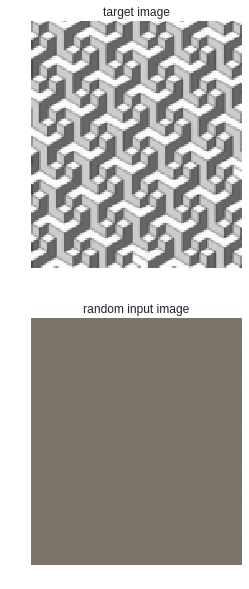

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 300, loss: 10849525.000000
Iteration: 600, loss: 4079093.750000
Iteration: 900, loss: 2713904.500000
Iteration: 1200, loss: 2332575.000000
Iteration: 1500, loss: 2107623.250000
Iteration: 1800, loss: 1920867.625000
Iteration: 2100, loss: 1769542.375000
Iteration: 2400, loss: 1655025.750000
Iteration: 2700, loss: 1573038.125000
Iteration: 3000, loss: 1477970.500000
--------------------
Final output


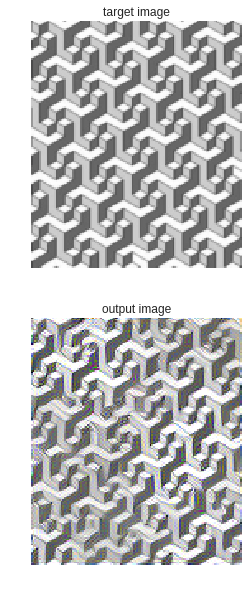

--------------------


In [ ]:
trained_output, trained_loss = texture_synthesis("squares.jpg", 
                                                 random_weights=False, pool='avg',
                                                 max_iter=MAX_ITER,
                                                 show_iter=SHOW_ITER)

In [ ]:
type(trained_output)

--------------------
Starting configuration
Random weights: True
Number of iterations: 3000
Loss display every 300 iterations
Image size: torch.Size([1, 3, 128, 128])
Pooling type: avg
--------------------


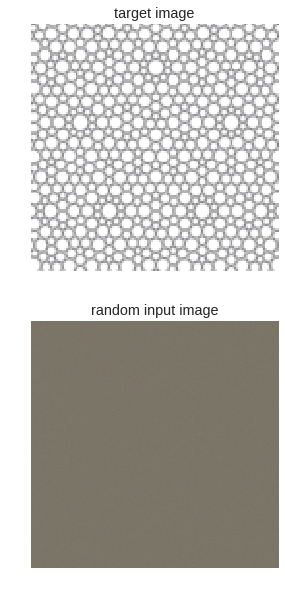

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 300, loss: 17.453218
Iteration: 600, loss: 0.760329
Iteration: 900, loss: 0.203906
Iteration: 1200, loss: 0.102646
Iteration: 1500, loss: 0.061202
Iteration: 1800, loss: 0.040574
Iteration: 2100, loss: 0.028826
Iteration: 2400, loss: 0.021227
Iteration: 2700, loss: 0.016449
Iteration: 3000, loss: 0.013006
--------------------
Final output


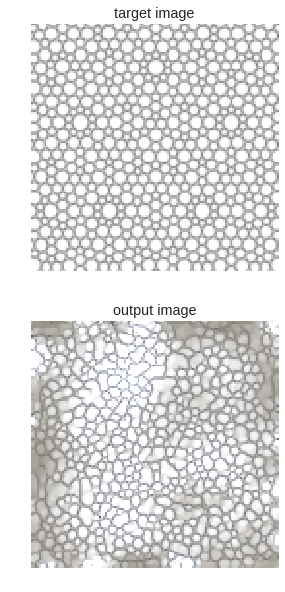

--------------------


In [ ]:
random_output, random_loss = texture_synthesis("penrose.jpg", 
                                                 random_weights=True, pool ='avg'
                                                 max_iter=MAX_ITER,
                                                 show_iter=SHOW_ITER)

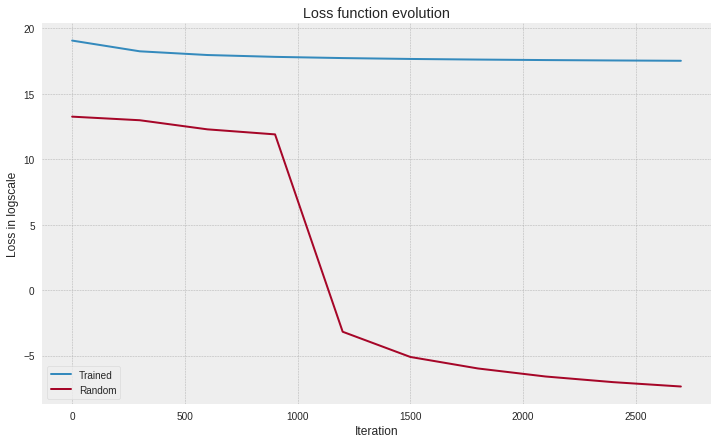

In [ ]:
plt.style.use('bmh')
plt.figure(figsize=(12, 7))
plt.plot(np.arange(len(trained_loss)) * SHOW_ITER,
         np.log(trained_loss), label="Trained")
plt.plot(np.arange(len(random_loss)) * SHOW_ITER,
         np.log(random_loss), label="Random")
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Loss function evolution")
plt.legend(frameon=True)
plt.savefig(os.path.join(result_dir, "trained_loss-leopard"))

In [ ]:
save_output(trained_output, "trained-leopard-3000")
save_output(random_output, "random-leopard-3000")

### Pebbles

In [ ]:
# Setup
MAX_ITER = 4000
SHOW_ITER = 400

--------------------
Starting configuration
Random weights: False
Number of iterations: 4000
Loss display every 400 iterations
--------------------


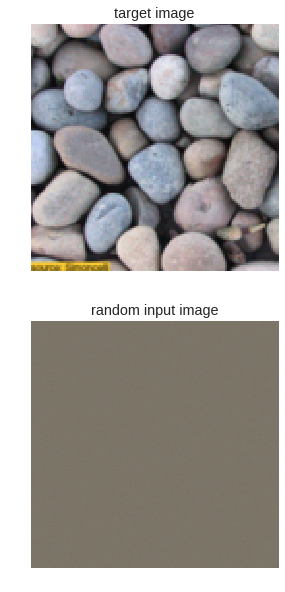

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:230: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:231: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 400, loss: 743962880.000000
Iteration: 800, loss: 566755776.000000
Iteration: 1200, loss: 511557888.000000
Iteration: 1600, loss: 485978880.000000
Iteration: 2000, loss: 470386944.000000
Iteration: 2400, loss: 460417824.000000
Iteration: 2800, loss: 453193088.000000
Iteration: 3200, loss: 447283968.000000
Iteration: 3600, loss: 442325376.000000
Iteration: 4000, loss: 438238752.000000
--------------------
Final output


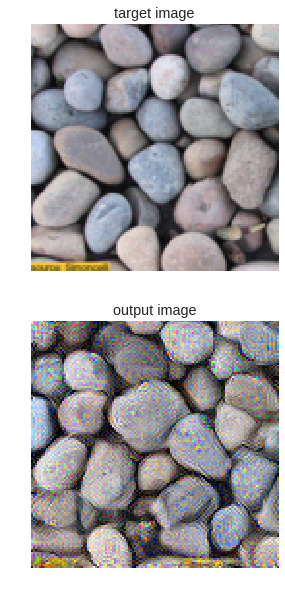

--------------------


In [ ]:
trained_output, trained_loss = texture_synthesis("pebbles.jpg", 
                                                 random_weights=False,
                                                 max_iter=MAX_ITER,
                                                 show_iter=SHOW_ITER)

--------------------
Starting configuration
Random weights: True
Number of iterations: 4000
Loss display every 400 iterations
--------------------


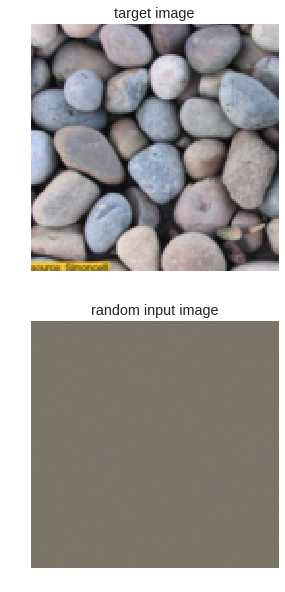

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:230: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:231: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 400, loss: 115182.812500
Iteration: 800, loss: 113988.960938
Iteration: 1200, loss: 90569.609375
Iteration: 1600, loss: 50329.214844
Iteration: 2000, loss: 0.593491
Iteration: 2400, loss: 0.037954
Iteration: 2800, loss: 0.011644
Iteration: 3200, loss: 0.005924
Iteration: 3600, loss: 0.003742
Iteration: 4000, loss: 0.002598
--------------------
Final output


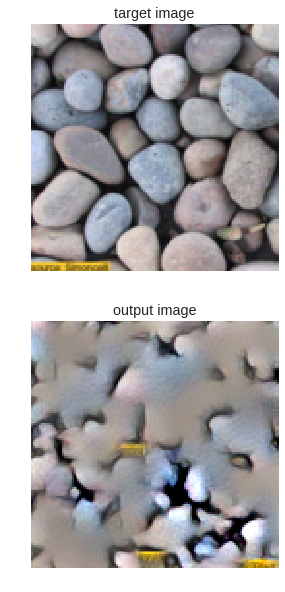

--------------------


In [ ]:
random_output, random_loss = texture_synthesis("pebbles.jpg", 
                                                 random_weights=True,
                                                 max_iter=MAX_ITER,
                                                 show_iter=SHOW_ITER)

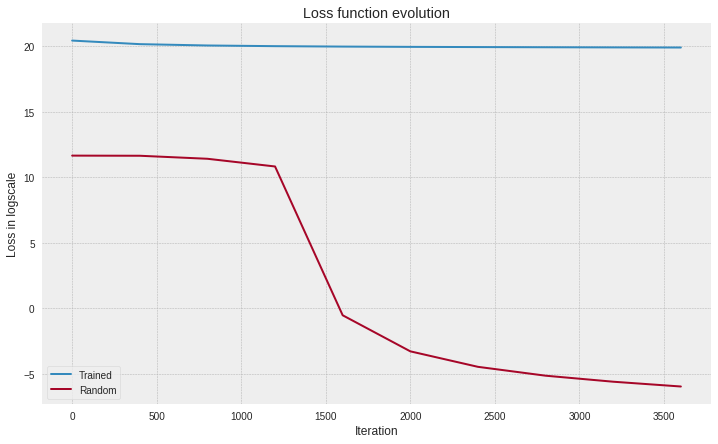

In [ ]:
plt.style.use('bmh')
plt.figure(figsize=(12, 7))
plt.plot(np.arange(len(trained_loss)) * SHOW_ITER,
         np.log(trained_loss), label="Trained")
plt.plot(np.arange(len(random_loss)) * SHOW_ITER,
         np.log(random_loss), label="Random")
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Loss function evolution")
plt.legend(frameon=True)
plt.savefig(os.path.join(result_dir, "loss-pebbles"))

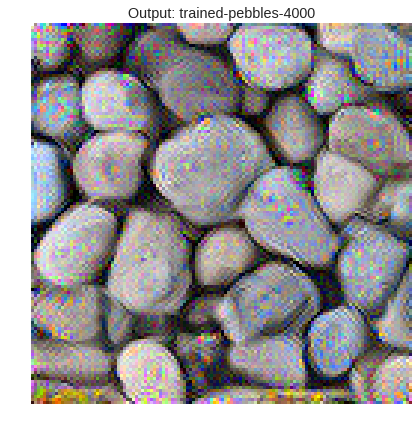

In [ ]:
save_output(trained_output, "trained-pebbles-4000")

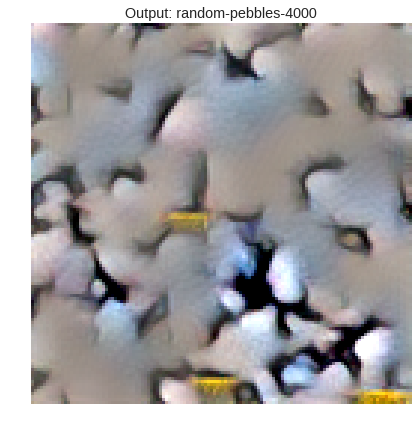

In [ ]:
save_output(random_output, "random-pebbles-4000")

### Tiny pebbles

In [ ]:
# Setup
MAX_ITER = 10000
SHOW_ITER = 1000

--------------------
Starting configuration
Random weights: False
Number of iterations: 10000
Loss display every 1000 iterations
--------------------


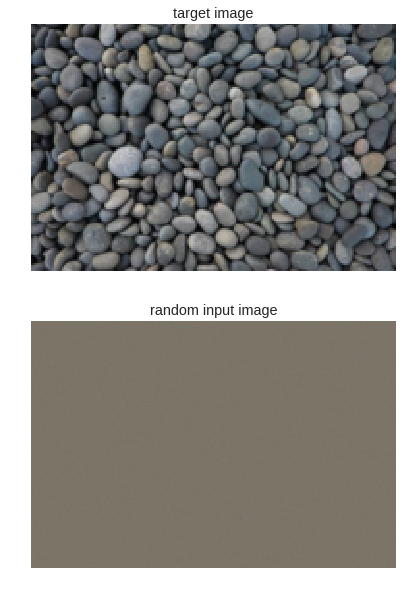

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:230: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:231: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 1000, loss: 33199866.000000
Iteration: 2000, loss: 25886498.000000
Iteration: 3000, loss: 23194918.000000
Iteration: 4000, loss: 21574098.000000
Iteration: 5000, loss: 20370610.000000
Iteration: 6000, loss: 19427340.000000
Iteration: 7000, loss: 18782514.000000
Iteration: 8000, loss: 18371394.000000
Iteration: 9000, loss: 18077814.000000
Iteration: 10000, loss: 17834116.000000
--------------------
Final output


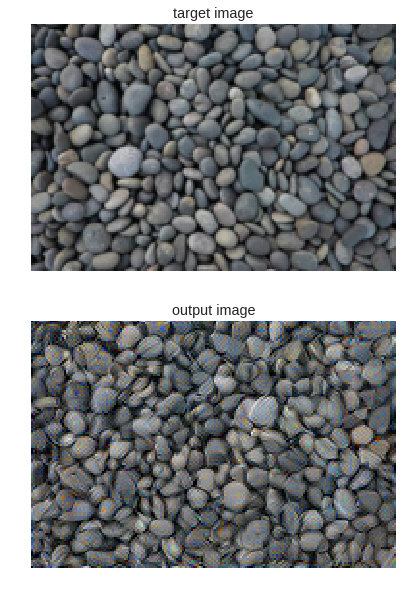

--------------------


In [ ]:
trained_output, trained_loss = texture_synthesis("tiny-pebbles.jpg", 
                                                 random_weights=False,
                                                 max_iter=MAX_ITER,
                                                 show_iter=SHOW_ITER)

--------------------
Starting configuration
Random weights: True
Number of iterations: 10000
Loss display every 1000 iterations
--------------------


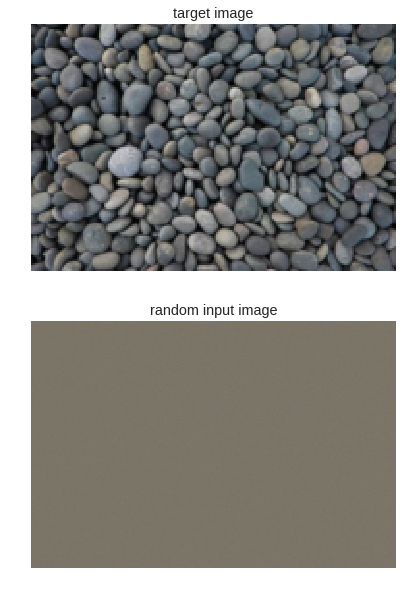

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:230: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:231: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 1000, loss: 56619.972656
Iteration: 2000, loss: 52782.472656
Iteration: 3000, loss: 0.009134
Iteration: 4000, loss: 0.000232
Iteration: 5000, loss: 0.000078
Iteration: 6000, loss: 0.000042
Iteration: 7000, loss: 0.000028
Iteration: 8000, loss: 0.000021
Iteration: 9000, loss: 0.000017
Iteration: 10000, loss: 0.000014
--------------------
Final output


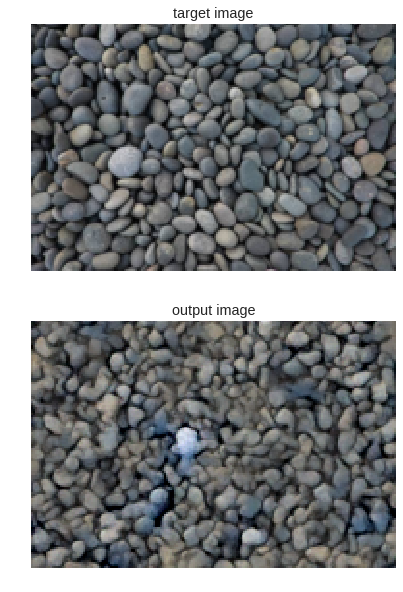

--------------------


In [ ]:
random_output, random_loss = texture_synthesis("tiny-pebbles.jpg", 
                                                 random_weights=True,
                                                 max_iter=MAX_ITER,
                                                 show_iter=SHOW_ITER)

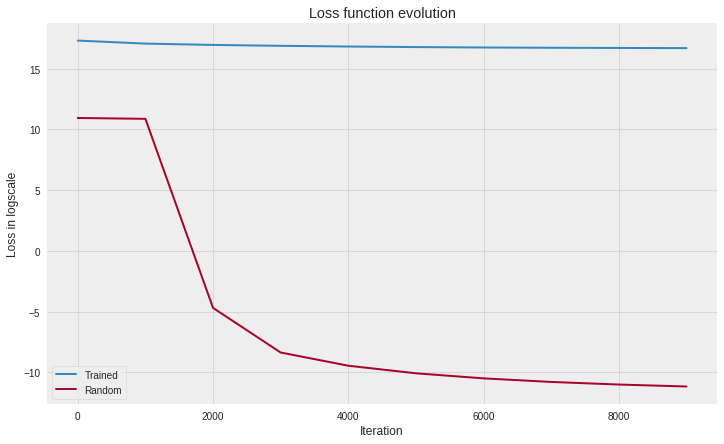

In [ ]:
plt.style.use('bmh')
plt.figure(figsize=(12, 7))
plt.plot(np.arange(len(trained_loss)) * SHOW_ITER,
         np.log(trained_loss), label="Trained")
plt.plot(np.arange(len(random_loss)) * SHOW_ITER,
         np.log(random_loss), label="Random")
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Loss function evolution")
plt.legend(frameon=True)
plt.savefig(os.path.join(result_dir, "loss-tiny-pebbles"))

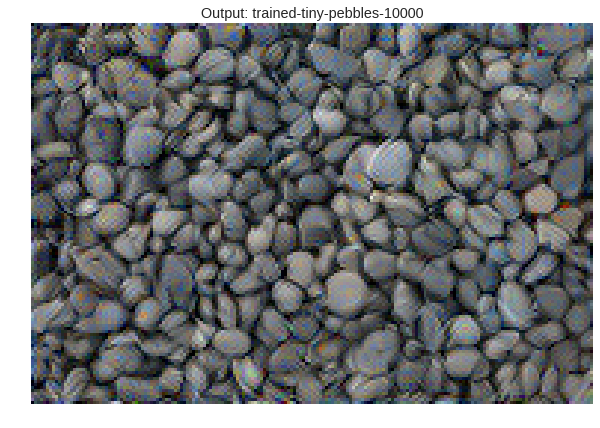

In [ ]:
save_output(trained_output, "trained-tiny-pebbles-10000")

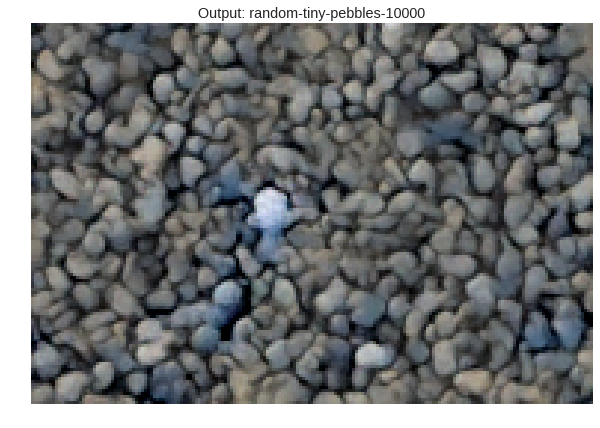

In [ ]:
save_output(random_output, "random-tiny-pebbles-10000")

### Max versus average pooling - leopard

In [ ]:
# Setup
MAX_ITER = 5000
SHOW_ITER = 500

--------------------
Starting configuration
Random weights: False
Number of iterations: 5000
Loss display every 500 iterations
Image size: torch.Size([1, 3, 128, 164])
Pooling type: max
--------------------


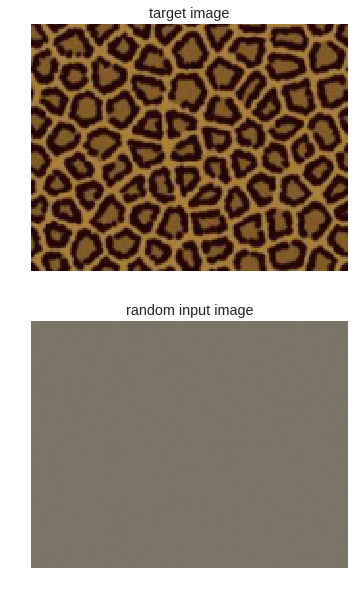

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 95131512.000000
Iteration: 1000, loss: 57584256.000000
Iteration: 1500, loss: 49028168.000000
Iteration: 2000, loss: 44414868.000000
Iteration: 2500, loss: 41242808.000000
Iteration: 3000, loss: 39169600.000000
Iteration: 3500, loss: 37548852.000000
Iteration: 4000, loss: 36166296.000000
Iteration: 4500, loss: 35083872.000000
Iteration: 5000, loss: 34307208.000000
--------------------
Final output


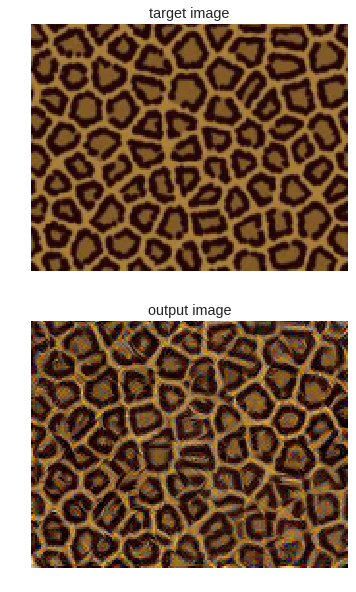

--------------------


In [ ]:
trained_output_max, trained_loss_max = texture_synthesis("leopard-skin.jpg",
                                                         pool="max",
                                                         random_weights=False,
                                                         max_iter=MAX_ITER,
                                                         show_iter=SHOW_ITER)

--------------------
Starting configuration
Random weights: False
Number of iterations: 5000
Loss display every 500 iterations
Image size: torch.Size([1, 3, 128, 164])
Pooling type: avg
--------------------


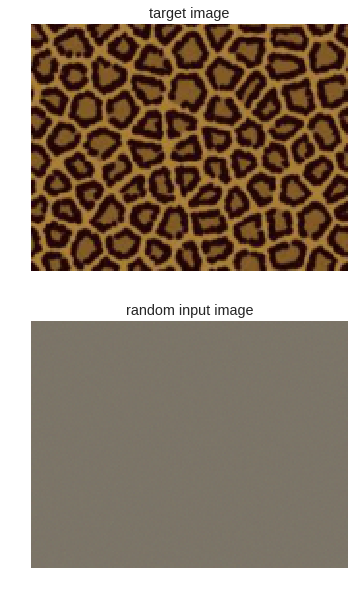

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 858191.875000
Iteration: 1000, loss: 533554.812500
Iteration: 1500, loss: 453646.843750
Iteration: 2000, loss: 412694.000000
Iteration: 2500, loss: 385978.375000
Iteration: 3000, loss: 363230.531250
Iteration: 3500, loss: 348580.593750
Iteration: 4000, loss: 335226.406250
Iteration: 4500, loss: 323809.812500
Iteration: 5000, loss: 314476.437500
--------------------
Final output


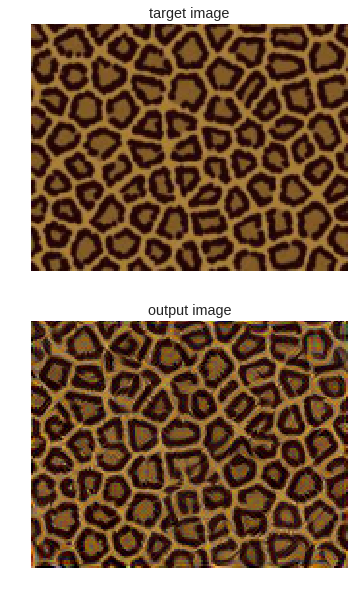

--------------------


In [ ]:
trained_output_avg, trained_loss_avg = texture_synthesis("leopard-skin.jpg",
                                                         pool="avg",
                                                         random_weights=False,
                                                         max_iter=MAX_ITER,
                                                         show_iter=SHOW_ITER)

--------------------
Starting configuration
Random weights: True
Number of iterations: 5000
Loss display every 500 iterations
Image size: torch.Size([1, 3, 128, 164])
Pooling type: max
--------------------


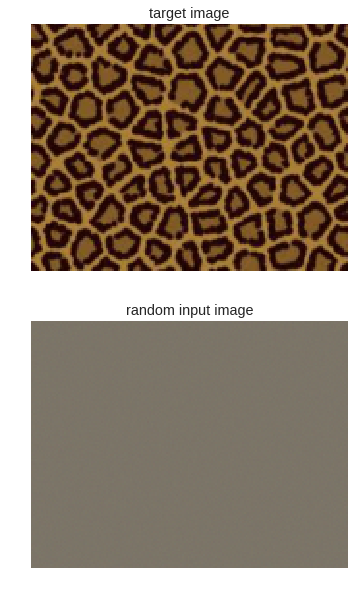

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 284349.281250
Iteration: 1000, loss: 257167.062500
Iteration: 1500, loss: 126197.484375
Iteration: 2000, loss: 0.953884
Iteration: 2500, loss: 0.017417
Iteration: 3000, loss: 0.004787
Iteration: 3500, loss: 0.002159
Iteration: 4000, loss: 0.001194
Iteration: 4500, loss: 0.000740
Iteration: 5000, loss: 0.000501
--------------------
Final output


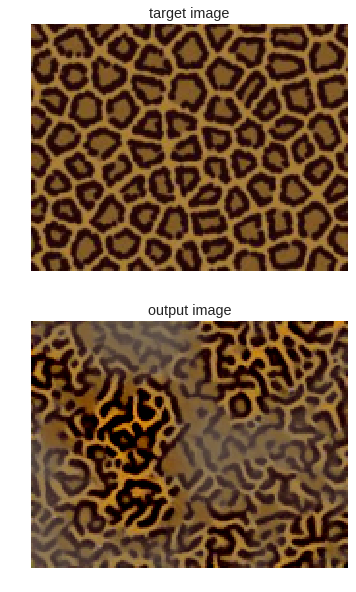

--------------------


In [ ]:
random_output_max, random_loss_max = texture_synthesis("leopard-skin.jpg",
                                                       pool="max",
                                                       random_weights=True,
                                                       max_iter=MAX_ITER,
                                                       show_iter=SHOW_ITER)

--------------------
Starting configuration
Random weights: True
Number of iterations: 5000
Loss display every 500 iterations
Image size: torch.Size([1, 3, 128, 164])
Pooling type: avg
--------------------


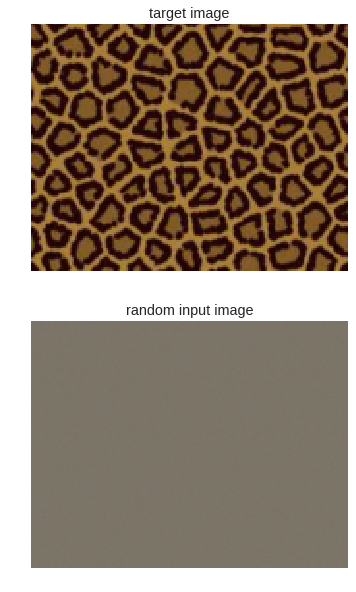

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 321906.156250
Iteration: 1000, loss: 180428.015625
Iteration: 1500, loss: 155901.515625
Iteration: 2000, loss: 136822.437500
Iteration: 2500, loss: 0.063059
Iteration: 3000, loss: 0.007364
Iteration: 3500, loss: 0.002637
Iteration: 4000, loss: 0.001379
Iteration: 4500, loss: 0.000855
Iteration: 5000, loss: 0.000589
--------------------
Final output


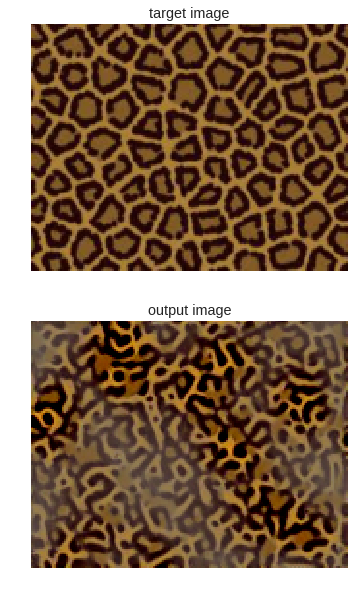

--------------------


In [ ]:
random_output_avg, random_loss_avg = texture_synthesis("leopard-skin.jpg",
                                                       pool="avg",
                                                       random_weights=True,
                                                       max_iter=MAX_ITER,
                                                       show_iter=SHOW_ITER)

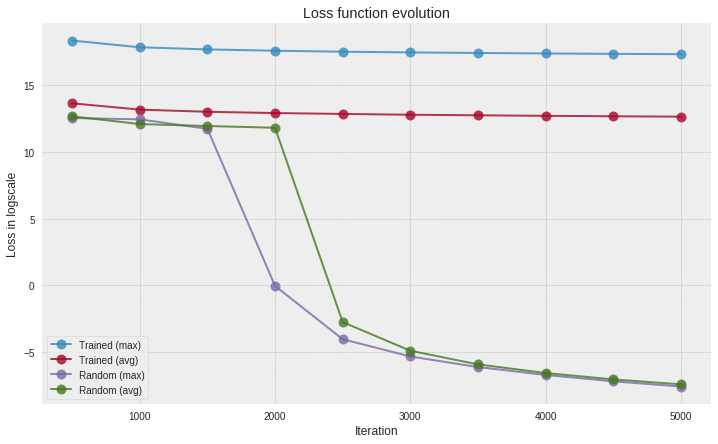

In [ ]:
plt.style.use('bmh')
plt.figure(figsize=(12, 7))
plt.plot(SHOW_ITER + np.arange(len(trained_loss_max)) * SHOW_ITER,
         np.log(trained_loss_max), label="Trained (max)",
         marker="o", markersize=10, alpha=0.8)
plt.plot(SHOW_ITER + np.arange(len(trained_loss_avg)) * SHOW_ITER,
         np.log(trained_loss_avg), label="Trained (avg)",
         marker="o", markersize=10, alpha=0.8)
plt.plot(SHOW_ITER + np.arange(len(random_loss_max)) * SHOW_ITER,
         np.log(random_loss_max), label="Random (max)",
         marker="o", markersize=10, alpha=0.8)
plt.plot(SHOW_ITER + np.arange(len(random_loss_avg)) * SHOW_ITER,
         np.log(random_loss_avg), label="Random (avg)",
         marker="o", markersize=10, alpha=0.8)
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Loss function evolution")
plt.legend(frameon=True)
plt.savefig(os.path.join(RESULT_DIR, "loss-leopard_max-avg"))

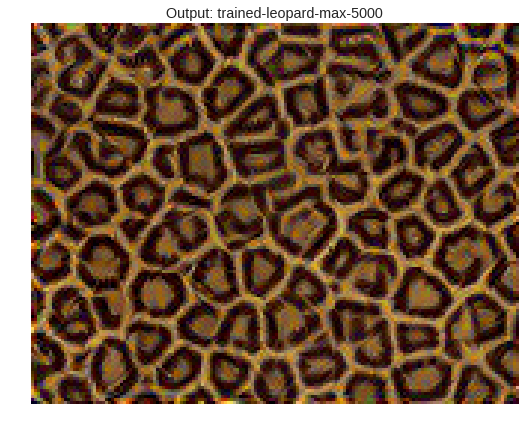

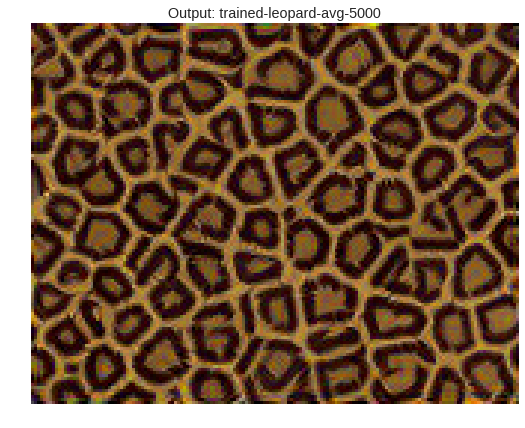

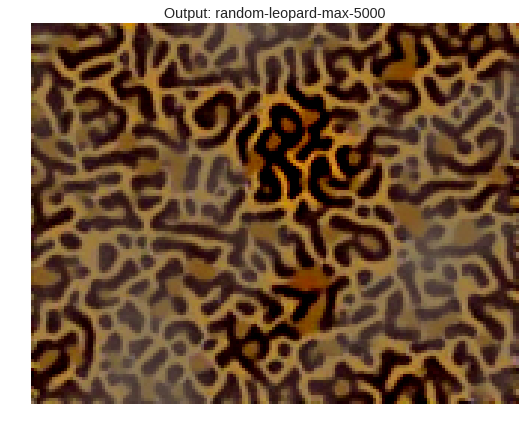

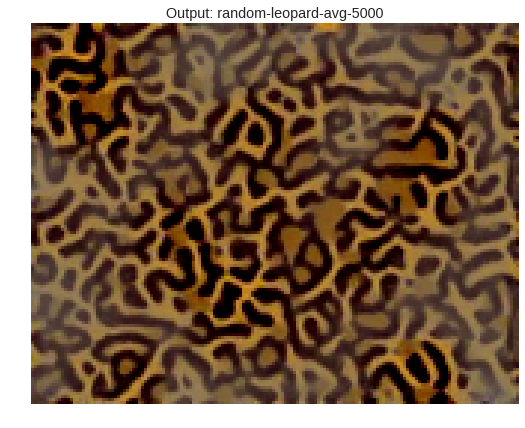

In [ ]:
save_output(trained_output_max, "trained-leopard-max-5000")
save_output(trained_output_avg, "trained-leopard-avg-5000")
save_output(random_output_max, "random-leopard-max-5000")
save_output(random_output_avg, "random-leopard-avg-5000")

### Max versus average pooling - tiny pebbles

In [ ]:
# Setup
MAX_ITER = 5000
SHOW_ITER = 500

--------------------
Starting configuration
Random weights: False
Number of iterations: 5000
Loss display every 500 iterations
Image size: torch.Size([1, 3, 128, 189])
Pooling type: max
--------------------


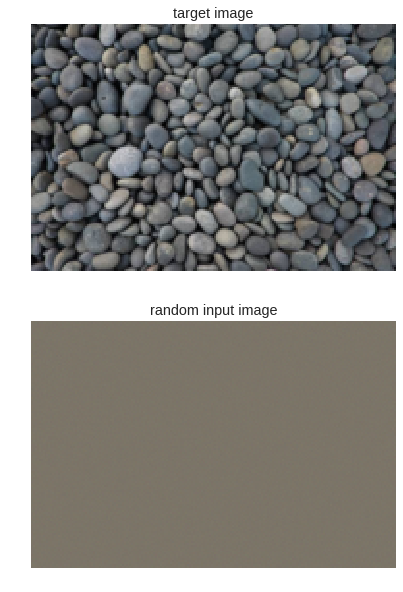

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 49227900.000000
Iteration: 1000, loss: 32912102.000000
Iteration: 1500, loss: 27639448.000000
Iteration: 2000, loss: 25309352.000000
Iteration: 2500, loss: 23893190.000000
Iteration: 3000, loss: 22889224.000000
Iteration: 3500, loss: 22145040.000000
Iteration: 4000, loss: 21511778.000000
Iteration: 4500, loss: 20976388.000000
Iteration: 5000, loss: 20497994.000000
--------------------
Final output


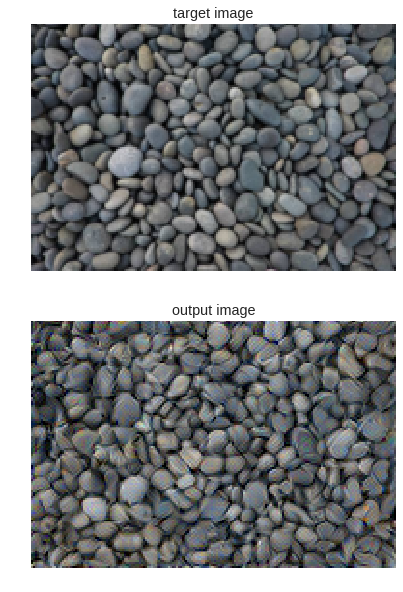

--------------------


In [ ]:
trained_output_max, trained_loss_max = texture_synthesis("tiny-pebbles.jpg",
                                                         pool="max",
                                                         random_weights=False,
                                                         max_iter=MAX_ITER,
                                                         show_iter=SHOW_ITER)

--------------------
Starting configuration
Random weights: False
Number of iterations: 5000
Loss display every 500 iterations
Image size: torch.Size([1, 3, 128, 189])
Pooling type: avg
--------------------


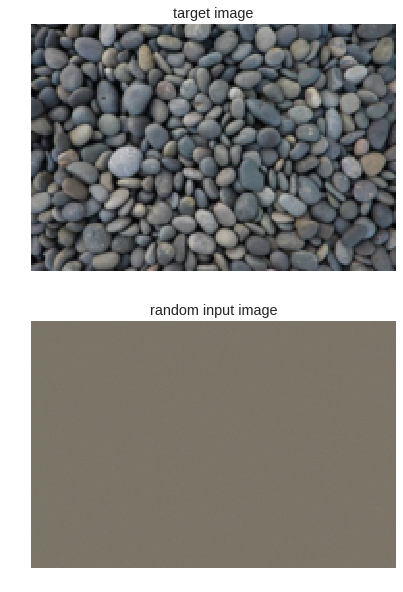

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 536594.687500
Iteration: 1000, loss: 351906.343750
Iteration: 1500, loss: 300464.468750
Iteration: 2000, loss: 271917.406250
Iteration: 2500, loss: 255466.781250
Iteration: 3000, loss: 244332.828125
Iteration: 3500, loss: 235642.015625
Iteration: 4000, loss: 229755.156250
Iteration: 4500, loss: 224799.250000
Iteration: 5000, loss: 219814.843750
--------------------
Final output


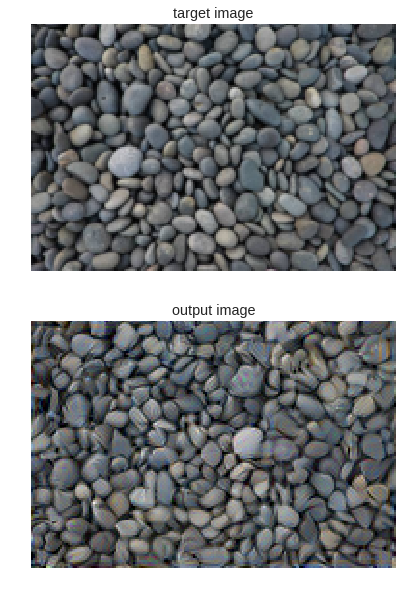

--------------------


In [ ]:
trained_output_avg, trained_loss_avg = texture_synthesis("tiny-pebbles.jpg",
                                                         pool="avg",
                                                         random_weights=False,
                                                         max_iter=MAX_ITER,
                                                         show_iter=SHOW_ITER)

--------------------
Starting configuration
Random weights: True
Number of iterations: 5000
Loss display every 500 iterations
Image size: torch.Size([1, 3, 128, 189])
Pooling type: max
--------------------


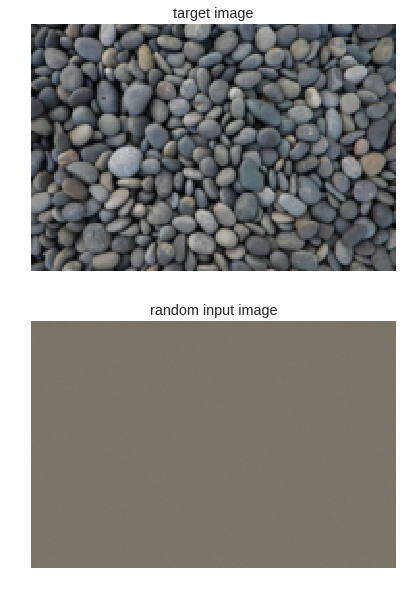

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 43015.726562
Iteration: 1000, loss: 42910.089844
Iteration: 1500, loss: 42204.515625
Iteration: 2000, loss: 37547.937500
Iteration: 2500, loss: 25372.232422
Iteration: 3000, loss: 0.007951
Iteration: 3500, loss: 0.000587
Iteration: 4000, loss: 0.000202
Iteration: 4500, loss: 0.000105
Iteration: 5000, loss: 0.000064
--------------------
Final output


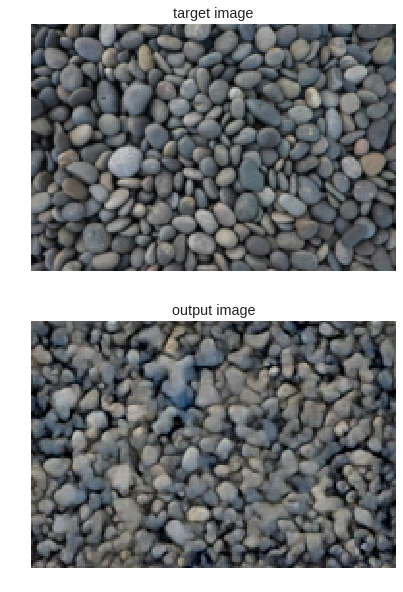

--------------------


In [ ]:
random_output_max, random_loss_max = texture_synthesis("tiny-pebbles.jpg",
                                                       pool="max",
                                                       random_weights=True,
                                                       max_iter=MAX_ITER,
                                                       show_iter=SHOW_ITER)

--------------------
Starting configuration
Random weights: True
Number of iterations: 5000
Loss display every 500 iterations
Image size: torch.Size([1, 3, 128, 189])
Pooling type: avg
--------------------


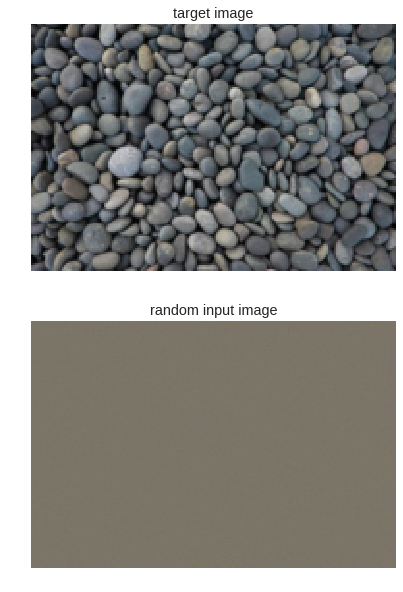

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 500, loss: 35255.328125
Iteration: 1000, loss: 35233.605469
Iteration: 1500, loss: 35174.500000
Iteration: 2000, loss: 34999.316406
Iteration: 2500, loss: 34448.085938
Iteration: 3000, loss: 32697.076172
Iteration: 3500, loss: 27715.597656
Iteration: 4000, loss: 18580.310547
Iteration: 4500, loss: 18578.195312
Iteration: 5000, loss: 18576.078125
--------------------
Final output


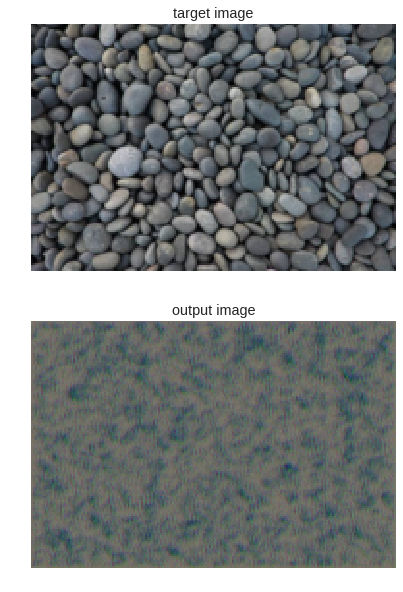

--------------------


In [ ]:
random_output_avg, random_loss_avg = texture_synthesis("tiny-pebbles.jpg",
                                                       pool="avg",
                                                       random_weights=True,
                                                       max_iter=MAX_ITER,
                                                       show_iter=SHOW_ITER)

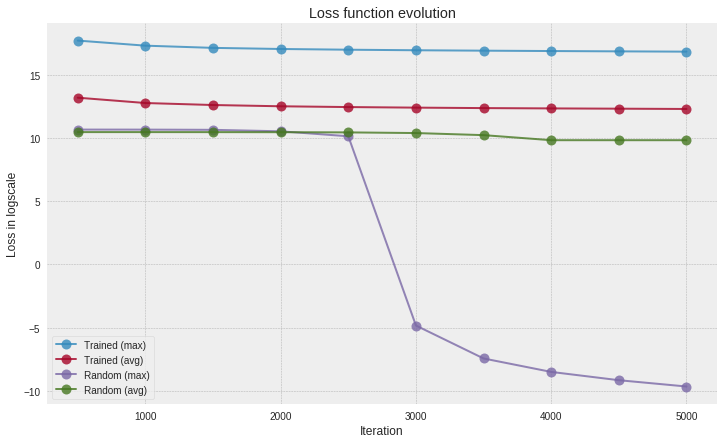

In [ ]:
plt.style.use('bmh')
plt.figure(figsize=(12, 7))
plt.plot(SHOW_ITER + np.arange(len(trained_loss_max)) * SHOW_ITER,
         np.log(trained_loss_max), label="Trained (max)",
         marker="o", markersize=10, alpha=0.8)
plt.plot(SHOW_ITER + np.arange(len(trained_loss_avg)) * SHOW_ITER,
         np.log(trained_loss_avg), label="Trained (avg)",
         marker="o", markersize=10, alpha=0.8)
plt.plot(SHOW_ITER + np.arange(len(random_loss_max)) * SHOW_ITER,
         np.log(random_loss_max), label="Random (max)",
         marker="o", markersize=10, alpha=0.8)
plt.plot(SHOW_ITER + np.arange(len(random_loss_avg)) * SHOW_ITER,
         np.log(random_loss_avg), label="Random (avg)",
         marker="o", markersize=10, alpha=0.8)
plt.ylabel("Loss in logscale")
plt.xlabel("Iteration")
plt.title("Loss function evolution")
plt.legend(frameon=True)
plt.savefig(os.path.join(RESULT_DIR, "loss-tiny-pebbles_max-avg"))

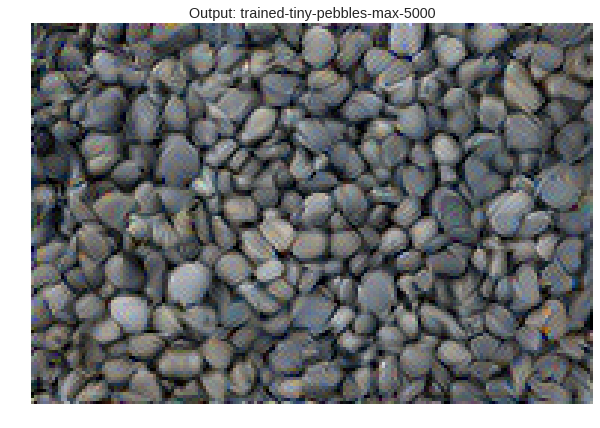

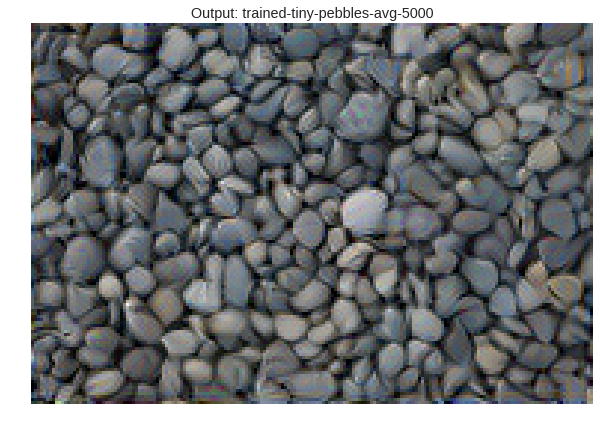

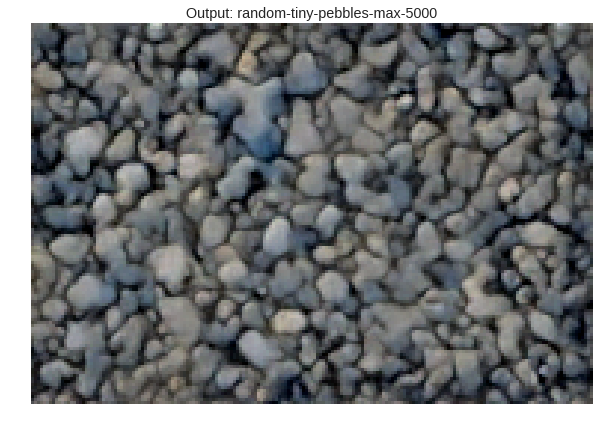

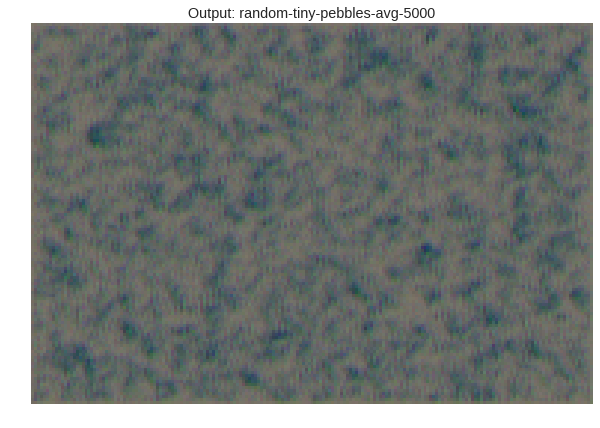

In [ ]:
save_output(trained_output_max, "trained-tiny-pebbles-max-5000")
save_output(trained_output_avg, "trained-tiny-pebbles-avg-5000")
save_output(random_output_max, "random-tiny-pebbles-max-5000")
save_output(random_output_avg, "random-tiny-pebbles-avg-5000")

###Weighting factors impact assessment

--------------------
Starting configuration
Random weights: False
Number of iterations: 3000
Loss display every 300 iterations
Image size: torch.Size([1, 3, 128, 128])
Pooling type: avg
--------------------


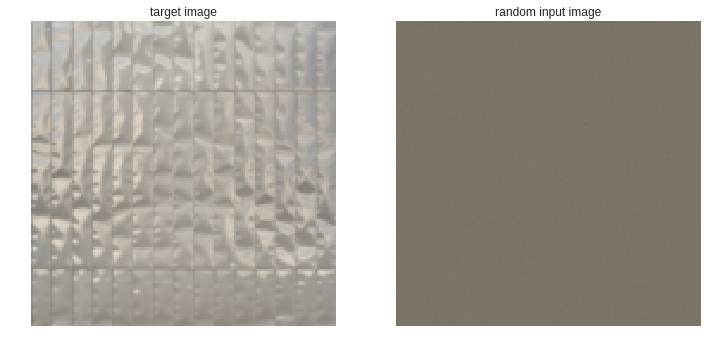

--------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:240: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:241: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 300, loss: 157624.718750
Iteration: 600, loss: 92325.054688
Iteration: 900, loss: 76721.023438
Iteration: 1200, loss: 68295.437500
Iteration: 1500, loss: 61730.570312
Iteration: 1800, loss: 57669.968750
Iteration: 2100, loss: 55074.742188
Iteration: 2400, loss: 52658.960938
Iteration: 2700, loss: 50522.132812
Iteration: 3000, loss: 48664.128906
--------------------
Final output


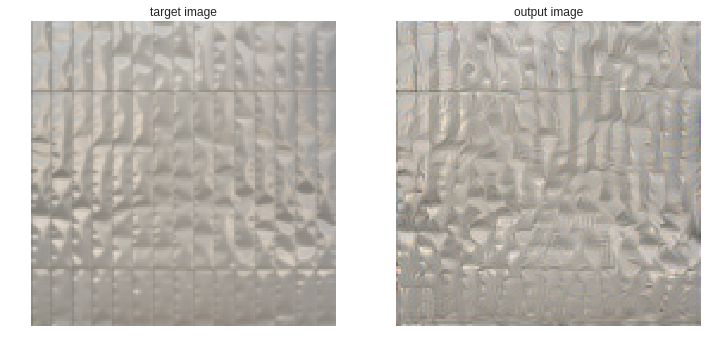

--------------------


In [ ]:
trained_output, trained_loss = texture_synthesis("TexturesCom_MetalVarious0085_2_S.png", 
                                                 random_weights=False, pool='avg',
                                                 max_iter=3000,
                                                 show_iter=300)

--------------------
Starting configuration
Random weights: True
Number of iterations: 3000
Loss display every 300 iterations
Image size: torch.Size([1, 3, 128, 128])
Pooling type: avg
--------------------


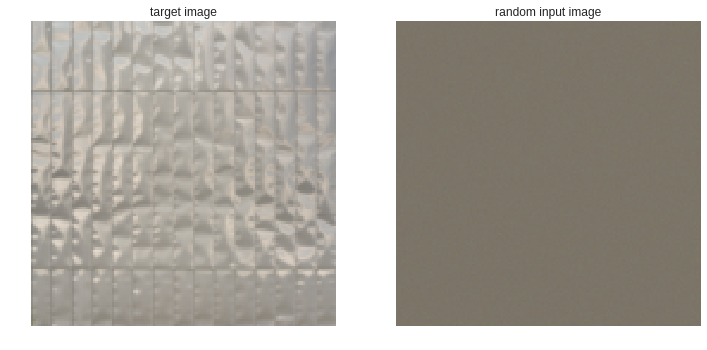

--------------------
Normalization factors:
3217.209991779011
3215.3223411393146
3215.318429651226
3215.318429651226
3215.318429651226


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:123: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:124: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 300, loss: 19.675047
Iteration: 600, loss: 3.039818
Iteration: 900, loss: 1.323966
Iteration: 1200, loss: 0.699176
Iteration: 1500, loss: 0.445146
Iteration: 1800, loss: 0.316571
Iteration: 2100, loss: 0.232410
Iteration: 2400, loss: 0.183547
Iteration: 2700, loss: 0.148987
Iteration: 3000, loss: 0.123104
--------------------
Final output


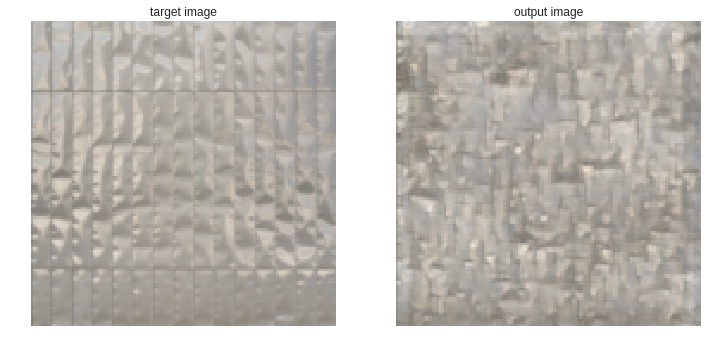

--------------------


In [ ]:
# Zero init
zero_output, zero_loss = grad_texture_synthesis_null_init("TexturesCom_MetalVarious0085_2_S.png", 
                                                 random_weights=True, pool='avg',
                                                 max_iter=3000,
                                                 show_iter=300)

--------------------
Starting configuration
Random weights: True
Number of iterations: 3000
Loss display every 300 iterations
Image size: torch.Size([1, 3, 128, 128])
Pooling type: avg
--------------------


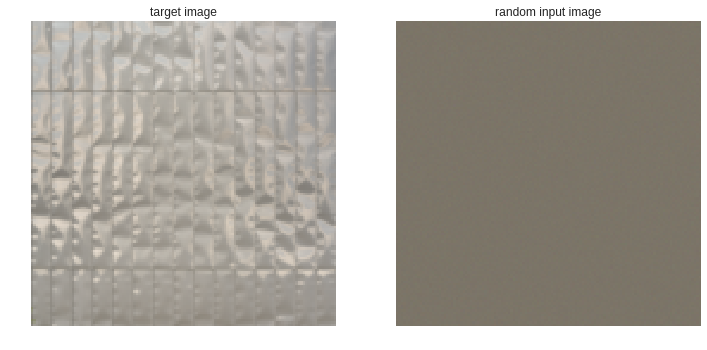

--------------------
Normalization factors:
778.9647970522805
1152590.5098236795
1352600887.909603
184785155714201.62
1.1647908040575112e+18


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:116: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:117: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 300, loss: 1.977906
Iteration: 600, loss: 0.459382
Iteration: 900, loss: 0.206206
Iteration: 1200, loss: 0.123748
Iteration: 1500, loss: 0.085071
Iteration: 1800, loss: 0.063070
Iteration: 2100, loss: 0.049141
Iteration: 2400, loss: 0.040598
Iteration: 2700, loss: 0.034312
Iteration: 3000, loss: 0.029274
--------------------
Final output


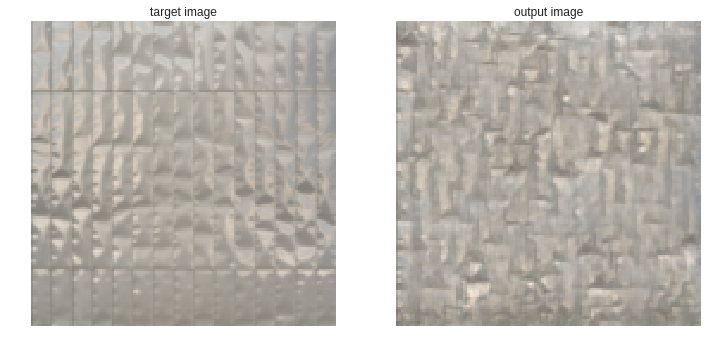

--------------------


In [ ]:
# Random init
random_output, random_loss = grad_texture_synthesis("TexturesCom_MetalVarious0085_2_S.png", 
                                                 random_weights=True, pool='avg',
                                                 max_iter=3000,
                                                 show_iter=300)

## Loss exploration

In [ ]:
origin = opt_img

noise = 10*np.random.normal(size=(1, 3, 128, 189))
orth1 = np.zeros((1, 3, 128, 189))
orth1[:, :, :64, :94] = noise[:, :, :64, :94]

orth2 = np.zeros((1, 3, 128, 189))
orth2[:, :, 64:, 94:] = noise[:, :, 64:, 94:]

xdir =   Variable(torch.tensor(orth1).type_as(style_image.data))
ydir =   Variable(torch.tensor(orth2).type_as(style_image.data))



X = np.linspace(-20, 20, 1000)
Y = np.linspace(-20, 20, 1000)
X, Y = np.meshgrid(X, Y)

def getLoss(inputImage):
  out = vgg(inputImage, loss_layers)
  layer_losses = [weights[a] * loss_fns[a](A, targets[a]) for a,A in enumerate(out)]
  loss = sum(layer_losses)
  return (loss)

Z = np.array([[np.log(getLoss(origin.detach() + ((1-a/1000)*-20 + (a/1000)*20)*xdir + (b*2/1000 - (1-b/1000)*20)*ydir)) for a in range(1000)] for b in range(1000)])



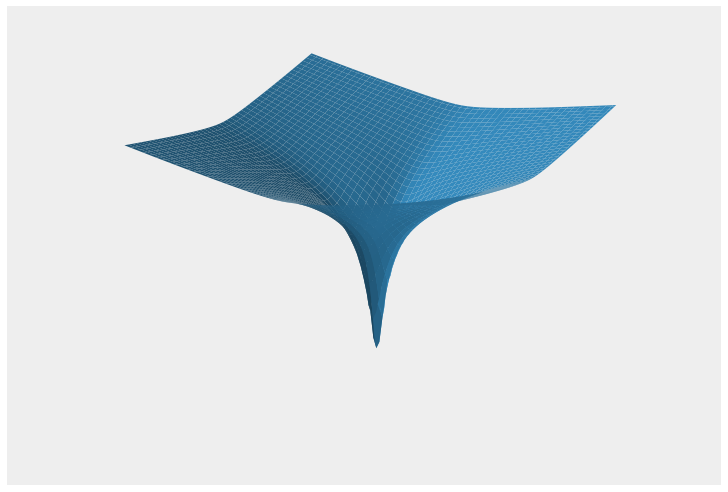

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
plt.style.use('bmh')
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.axis('off')
ax.plot_surface(X, Y, Z)
plt.savefig('trained_weights.svg', format='svg')

(-0.5, 188.5, 127.5, -0.5)

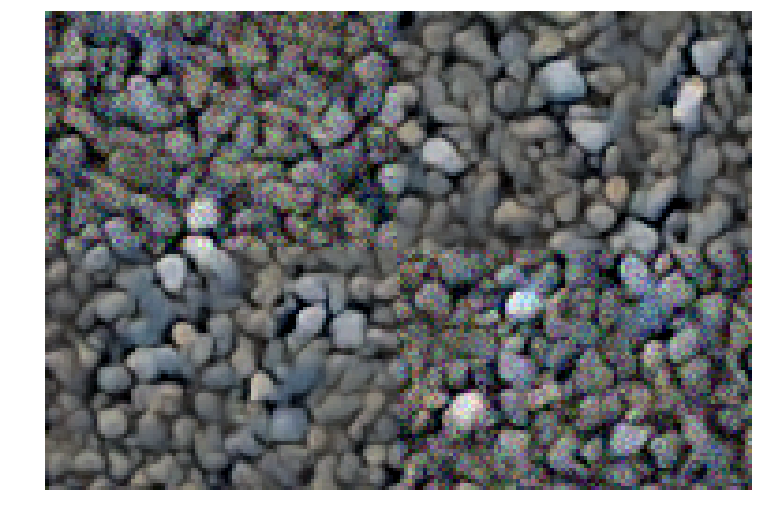

In [ ]:
out = origin.detach() + ((1-0/100)*-2 + (0/100)*2)*xdir + (0*2/100 - (1-0/100)*2)*ydir
out = postp(torch.tensor(out).cpu().squeeze())
plt.imshow(out)
plt.axis("off")